In [1]:
import define_rgbsample
import define_rgbtgassample
import dispmodels
import fitDisp
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import emcee
import safe_colours
import pickle
import corner
import os
from galpy.actionAngle import actionAngleStaeckel, estimateDeltaStaeckel
from galpy.potential import MWPotential2014
from galpy.util import bovy_coords
from galpy.df import quasiisothermaldf
import tqdm
from astropy.io import fits
from astropy.table import Table, join
from scipy.stats import gaussian_kde
from scipy.integrate import quad
safe_colours = safe_colours.initialise()
col_dict = safe_colours.distinct_named()
cm_rainbow = safe_colours.colourmap('rainbow')
cm_heat = safe_colours.colourmap('heat')
cm_diverging = safe_colours.colourmap('diverging') 

params = {'axes.labelsize': 14, 'xtick.labelsize': 12, 'ytick.labelsize': 12, 'text.usetex': True, 'lines.linewidth': 1,
          'axes.titlesize': 14, 'font.family': 'serif'}
plt.rcParams.update(params)

columnwidth = 240./72.27
textwidth = 504.0/72.27

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#cosmology 
Omega0, OmegaLambda, a_0, h = 0.307, 0.693, 1., 0.6777


def t_lookback(a):
    return a / (np.sqrt(Omega0 * a + OmegaLambda * (a ** 4)))

t_em = quad(t_lookback, 0., a_0)[0]
t_em = (1 / (h * 100)) * (3.086e19 / 3.1536e16) * t_em

def z2age(z):
    a = 1 / (1 + z)
    t = np.array([quad(t_lookback, x, a_0)[0] for x in a])
    return (1 / (h * 100)) * (3.086e19 / 3.1536e16) * t


def z2tau(z):
    a = 1 / (1 + z)
    t = np.array([quad(t_lookback, x, a_0)[0] for x in a])
    return t_em - ((1 / (h * 100)) * (3.086e19 / 3.1536e16) * t)

/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/astjmack/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module in

/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)

/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)

/home/astjmack/anaconda3/lib/python3.6/site-packages/astropy/coordinates/sky_coordinate.py:1598: AstropyDeprecationWarning: Passing a frame as a positional argument is now deprecated, use the frame= keyword argument instead.
  "instead.", AstropyDeprecationWarning)

/home/astjmack/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)

/home/astjmack/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` t

In [2]:
if os.path.isfile('../sav/DR14_Gaia_astroNNAges_dists_galcencyl.npy'):
    with open('../sav/DR14_Gaia_astroNNAges_dists_galcencyl.npy', 'rb') as f:
        dat = np.load(f)
        Rpz = np.load(f)
        vRvTvz = np.load(f)
        cov_galcencyl = np.load(f)
        
print(len(dat))
#load orbit catalogue
orbits = fits.open('/gal/sdss_lsm/APOGEE_gaiarvs_orbitparams.fits')
#cross match
allStar_tab = Table(data=dat)
orbits_tab = Table(data=orbits[1].data)
tab = join(allStar_tab, orbits_tab, 
                   keys='APOGEE_ID', 
                   uniq_col_name='{col_name}{table_name}', 
                   table_names=['','_orbits'])
dat = tab.as_array()
print('%i stars with orbits...' % len(dat))

mp = MWPotential2014
deltas = estimateDeltaStaeckel(mp, Rpz[:,0], Rpz[:,2], no_median=True)

aAS = actionAngleStaeckel(pot=mp, delta=0.4)
e, Zmax, rperi, rap = aAS.EccZmaxRperiRap(Rpz[:,0], vRvTvz[:,0] , vRvTvz[:,1], Rpz[:,2], vRvTvz[:,2], Rpz[:,1], delta=deltas)

65719
65719 stars with orbits...
/home/astjmack/anaconda3/lib/python3.6/site-packages/galpy-1.4.dev0-py3.6-linux-x86_64.egg/galpy/util/bovy_coords.py:2037: RuntimeWarning: overflow encountered in sinh
  R= delta*sc.sinh(u)*sc.sin(v)

/home/astjmack/anaconda3/lib/python3.6/site-packages/galpy-1.4.dev0-py3.6-linux-x86_64.egg/galpy/util/bovy_coords.py:2038: RuntimeWarning: overflow encountered in cosh
  z= delta*sc.cosh(u)*sc.cos(v)



In [3]:
if os.path.isfile('../sav/apdr14gaiadr2_astroNN_ages_distances_ellipsoid_fixedv0_monoage_samples.npy'):
    with open('../sav/apdr14gaiadr2_astroNN_ages_distances_ellipsoid_fixedv0_monoage_samples.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        co_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
        co_med_z = np.load(f)
        
agebins = np.arange(1.,14.,1.5)
fehbins = np.arange(-0.6,0.6,0.1)

lo_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,11,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.nanpercentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.nanpercentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.nanpercentile(co_samples[i,j], [16,50,84], axis=0).T

/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  



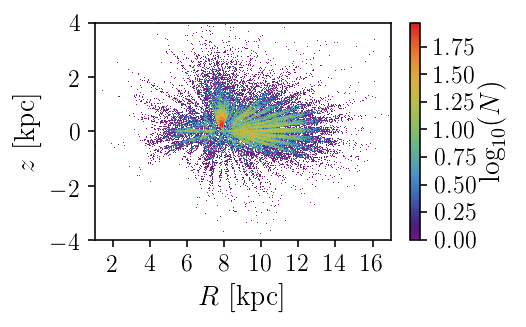

In [32]:
fig = plt.figure()
fig.set_size_inches(columnwidth,0.6*columnwidth)
xbins, ybins = np.linspace(1.,17.,300), np.linspace(-4,4.,300)

hist, xedges, yedges = np.histogram2d(Rpz[:,0]*8., Rpz[:,2]*8., bins=[xbins,ybins])
plt.imshow(np.rot90(np.log10(hist)), extent=[1.,17.,-4,4.], cmap=cm_rainbow, aspect='auto')
plt.xticks([2,4,6,8,10,12,14,16])
plt.colorbar(label=r'$\log_{10}(N)$')
plt.ylabel(r'$z\ \mathrm{[kpc]}$')
plt.xlabel(r'$R\ \mathrm{[kpc]}$')

plt.savefig('../plots/Rz_distribution.png', format='png', dpi=400, bbox_inches='tight')
plt.savefig('../plots/Rz_distribution.pdf', format='pdf', dpi=400, bbox_inches='tight')


In [75]:
params = []
params.extend([1/8.,])
params.extend(np.ones((len(agebins)*len(fehbins)))*np.log10(50.))
params.extend(np.ones((len(agebins)*len(fehbins)))*1)
params.extend(np.ones((len(agebins)*len(fehbins)))*1)
params.extend([1/8.,])
params.extend(np.ones((len(agebins)*len(fehbins)))*np.log10(50.))
params.extend(np.ones((len(agebins)*len(fehbins)))*1)
params.extend(np.ones((len(agebins)*len(fehbins)))*1)
params.extend(np.ones((len(agebins)*len(fehbins)))*0.001)
len(params)

758

In [97]:
test = np.array(params[4*(len(agebins)*len(fehbins))+2:5*(len(agebins)*len(fehbins))+2]).reshape(len(agebins), len(fehbins))
test[1,0] = 0.

In [99]:
tis = np.ones(50).astype(int)
tis[0] = 0
tjs = np.zeros(50).astype(int)

test[tis,tjs]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [95]:
tis

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

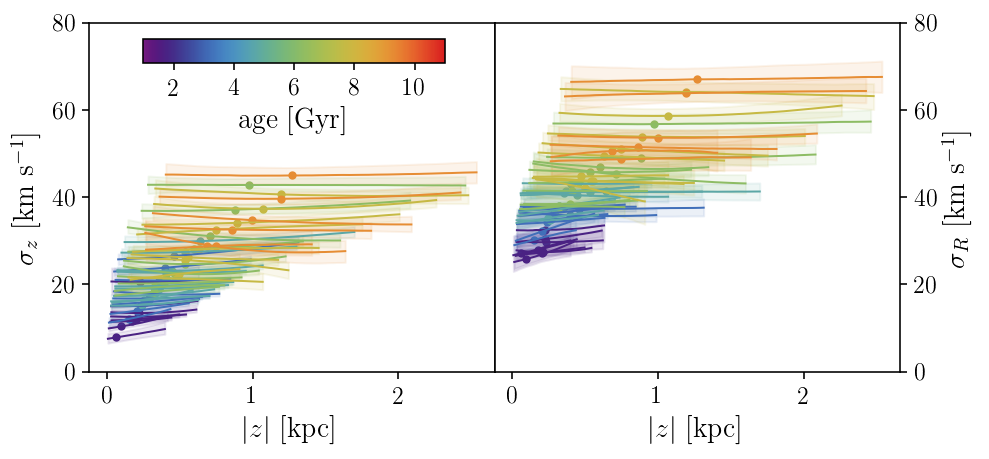

In [4]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def gen_sigma_profs(samples, med_z, sigmar=False):
    zs = np.linspace(med_z[0], med_z[4], 50)
    profs = np.zeros([len(samples),len(zs)])
    mz = med_z[2]
    for i in range(len(samples)):
        if sigmar:
            profs[i] = sigma_profile(zs, samples[i,2], samples[i,3], 10**samples[i,1], mz)
        else:
            profs[i] = sigma_profile(zs, samples[i,6], samples[i,7], 10**samples[i,5], mz)
    return zs, profs
  
norm = matplotlib.colors.Normalize(
    vmin=1.,
    vmax=11.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([])   

fig,ax = plt.subplots(1,2, sharex=True)
fig.set_size_inches(textwidth,columnwidth)
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        zs, profs = gen_sigma_profs(co_samples[i,j], co_med_z[i,j])
        ax[0].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[0].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
        ax[0].scatter(co_med_z[i,j,2], 10**np.median(co_samples[i,j,:,5]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        zs, profs = gen_sigma_profs(co_samples[i,j], co_med_z[i,j], sigmar=True)
        ax[1].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[1].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
        ax[1].scatter(co_med_z[i,j,2], 10**np.median(co_samples[i,j,:,1]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        
ax[0].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_ylim(0.,80.)
ax[1].set_ylim(0.,80.)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax= fig.add_axes([0.15,0.85,0.3,0.05])
plt.colorbar(s_m, cax=cax,label=r'$\mathrm{age\ [Gyr]}$', orientation='horizontal')

plt.savefig('../plots/sigma_fz_combined_DR2_astronn_dist.png', format='png', dpi=400)
plt.savefig('../plots/sigma_fz_combined_DR2_astronn_dist.pdf', format='pdf', dpi=400)




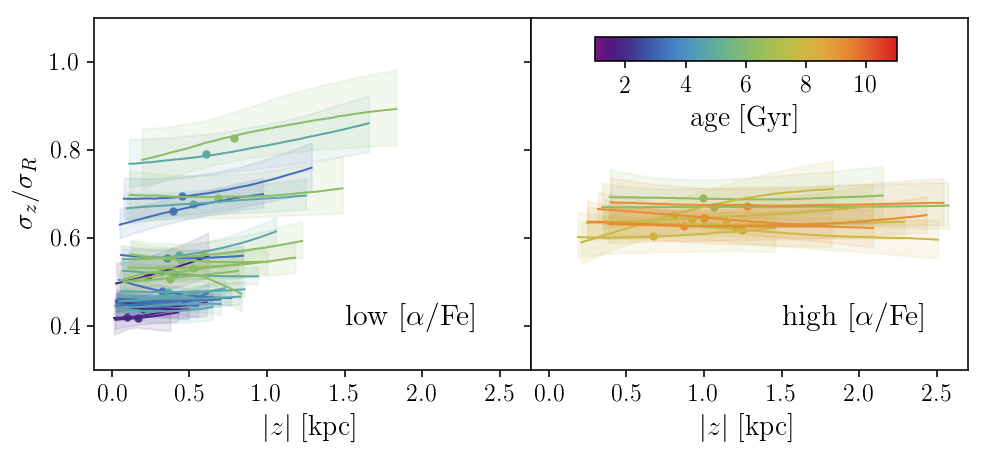

In [17]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def gen_sigma_profs(samples, med_z):
    zs = np.linspace(med_z[0], med_z[4], 50)
    profs = np.zeros([len(samples),len(zs)])
    mz = med_z[2]
    for i in range(len(samples)):
            profs[i] = sigma_profile(zs, samples[i,6], samples[i,7], 10**samples[i,5], mz)/sigma_profile(zs, samples[i,2], samples[i,3], 10**samples[i,1], mz)
    return zs, profs
  
norm = matplotlib.colors.Normalize(
    vmin=1.,
    vmax=11.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([])   

fig,ax = plt.subplots(1,2, sharex=True, sharey=True)
fig.set_size_inches(textwidth,columnwidth)
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        if lo_nbins[i,j] > 300 :
            zs, profs = gen_sigma_profs(lo_samples[i,j], lo_med_z[i,j])
            ax[0].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
            ax[0].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
            ax[0].scatter(lo_med_z[i,j,2], 10**np.median(lo_samples[i,j,:,5])/10**np.median(lo_samples[i,j,:,1]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        if hi_nbins[i,j] > 300:
            zs, profs = gen_sigma_profs(hi_samples[i,j], hi_med_z[i,j])
            ax[1].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
            ax[1].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
            ax[1].scatter(hi_med_z[i,j,2], 10**np.median(hi_samples[i,j,:,5])/10**np.median(hi_samples[i,j,:,1]), color=s_m.to_rgba(agegrid[i,j]), s=10)

ax[0].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')


ax[0].set_ylabel(r'$\sigma_{z}/\sigma_{R}$')
ax[0].set_ylim(0.3,1.1)
ax[0].text(1.5,0.4,r'$\mathrm{low\ [\alpha/Fe]}$', fontsize=15)
ax[1].text(1.5,0.4,r'$\mathrm{high\ [\alpha/Fe]}$', fontsize=15)



fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax= fig.add_axes([0.6,0.85,0.3,0.05])
plt.colorbar(s_m, cax=cax,label=r'$\mathrm{age\ [Gyr]}$', orientation='horizontal')

plt.savefig('../plots/sigmazR_fz_combined_DR2_astronn_dist.png', format='png', dpi=400)
plt.savefig('../plots/sigmazR_fz_combined_DR2_astronn_dist.pdf', format='pdf', dpi=400)





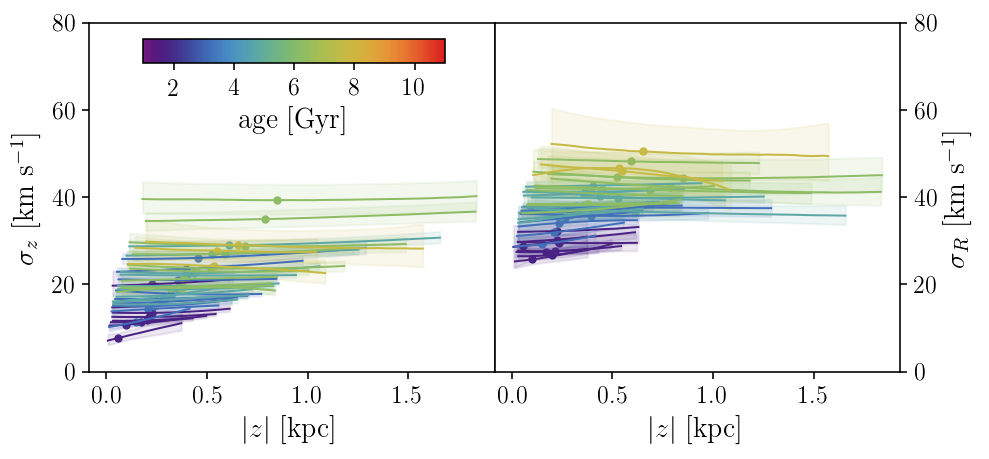

In [90]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def gen_sigma_profs(samples, med_z, sigmar=False):
    zs = np.linspace(med_z[0], med_z[4], 50)
    profs = np.zeros([len(samples),len(zs)])
    mz = med_z[2]
    for i in range(len(samples)):
        if sigmar:
            profs[i] = sigma_profile(zs, samples[i,2], samples[i,3], 10**samples[i,1], mz)
        else:
            profs[i] = sigma_profile(zs, samples[i,6], samples[i,7], 10**samples[i,5], mz)
    return zs, profs
  
norm = matplotlib.colors.Normalize(
    vmin=1.,
    vmax=11.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([])   

fig,ax = plt.subplots(1,2, sharex=True)
fig.set_size_inches(textwidth,columnwidth)
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        zs, profs = gen_sigma_profs(lo_samples[i,j], lo_med_z[i,j])
        ax[0].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[0].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
        ax[0].scatter(lo_med_z[i,j,2], 10**np.median(lo_samples[i,j,:,5]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        zs, profs = gen_sigma_profs(lo_samples[i,j], lo_med_z[i,j], sigmar=True)
        ax[1].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[1].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
        ax[1].scatter(lo_med_z[i,j,2], 10**np.median(lo_samples[i,j,:,1]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        
ax[0].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_ylim(0.,80.)
ax[1].set_ylim(0.,80.)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax= fig.add_axes([0.15,0.85,0.3,0.05])
plt.colorbar(s_m, cax=cax,label=r'$\mathrm{age\ [Gyr]}$', orientation='horizontal')



In [10]:
co_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
co_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
co_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
co_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
co_jz = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_jz = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_jz = np.zeros([len(agebins)-1, len(fehbins)-1])
co_16jz = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_16jz = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_16jz = np.zeros([len(agebins)-1, len(fehbins)-1])
co_84jz = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_84jz = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_84jz = np.zeros([len(agebins)-1, len(fehbins)-1])

for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        co_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]/2.)
        lo_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))]/2.)
        hi_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)]/2.)
        co_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_jz[i,j] = np.nanmedian((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_jz[i,j] = np.nanmedian((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_jz[i,j] = np.nanmedian((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_16jz[i,j] = np.nanpercentile((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])], 16)
        lo_16jz[i,j] = np.nanpercentile((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))], 16)
        hi_16jz[i,j] = np.nanpercentile((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)], 16)
        co_84jz[i,j] = np.nanpercentile((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])], 84)
        lo_84jz[i,j] = np.nanpercentile((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))], 84)
        hi_84jz[i,j] = np.nanpercentile((dat['jz'])[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)], 84)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1019: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1259: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)



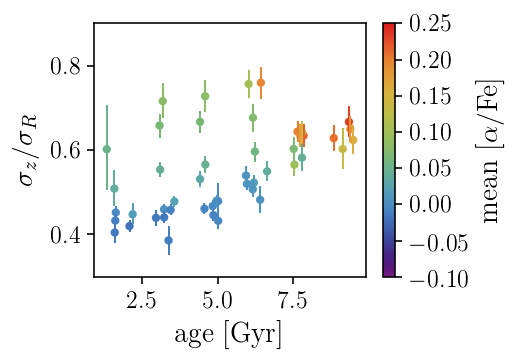

In [12]:
norm = matplotlib.colors.Normalize(
    vmin=-0.1,
    vmax=0.25)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.1*columnwidth,0.8*columnwidth)
mask = co_nbins.ravel() > 200
yerr = np.dstack([10**co_par[:,:,1,0].ravel()[mask]-10**co_par[:,:,1,1].ravel()[mask], 10**co_par[:,:,1,2].ravel()[mask]-10**co_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**co_par[:,:,5,0].ravel()[mask]-10**co_par[:,:,5,1].ravel()[mask], 10**co_par[:,:,5,0].ravel()[mask]-10**co_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**co_par[:,:,5,1].ravel()[mask]/10**co_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**co_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**co_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(co_alpha.ravel()[mask]) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(co_alpha.ravel()[mask]), lw=1.)
plt.ylim(0.3,0.9)
plt.colorbar(s_m, label=r'$\mathrm{mean\ [\alpha/Fe]}$')
plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

plt.savefig('../plots/sigma_z_R_age_combined_DR2_astronn_dist.png', format='png', dpi=400)
plt.savefig('../plots/sigma_z_R_age_combined_DR2_astronn_dist.pdf', format='pdf', dpi=400)


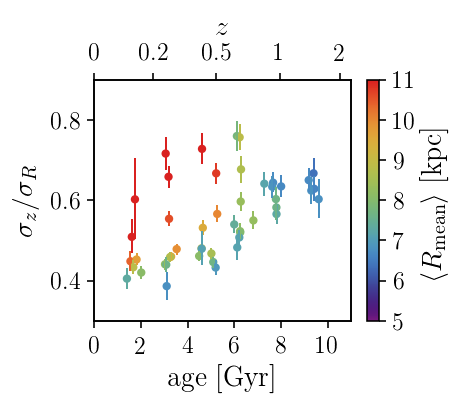

In [19]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = co_nbins.ravel() > 200
yerr = np.dstack([10**co_par[:,:,1,0].ravel()[mask]-10**co_par[:,:,1,1].ravel()[mask], 10**co_par[:,:,1,2].ravel()[mask]-10**co_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**co_par[:,:,5,0].ravel()[mask]-10**co_par[:,:,5,1].ravel()[mask], 10**co_par[:,:,5,0].ravel()[mask]-10**co_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**co_par[:,:,5,1].ravel()[mask]/10**co_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**co_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**co_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(co_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(co_rmean.ravel()[mask]*8.), lw=1.)
plt.ylim(0.3,0.9)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()

plt.savefig('../plots/sigma_z_R_age_rmean_astronn_dist.png', format='png', dpi=400, bbox_inches='tight')
plt.savefig('../plots/sigma_z_R_age_rmean_astronn_dist.pdf', format='pdf', dpi=400, bbox_inches='tight')




/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



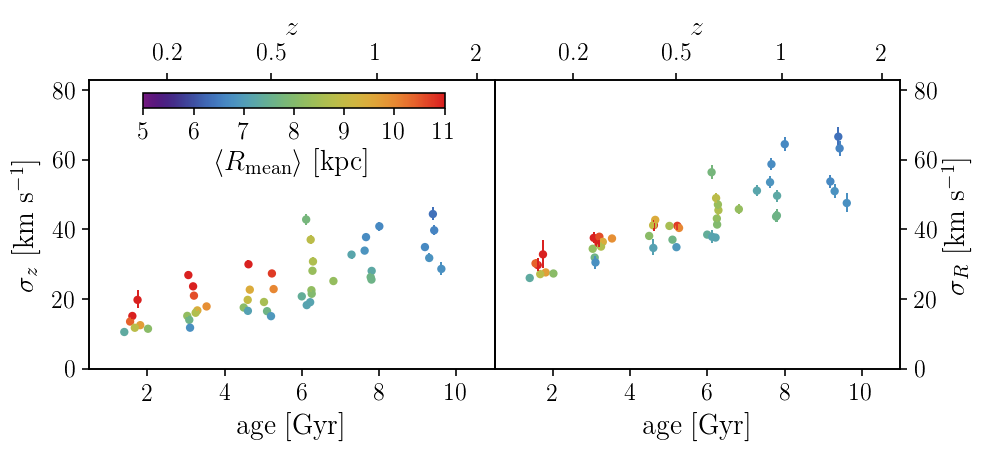

In [22]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = co_nbins.ravel() > 200
yerr = np.dstack([10**co_par[:,:,5,1].ravel()[mask]-10**co_par[:,:,5,0].ravel()[mask], 10**co_par[:,:,5,2].ravel()[mask]-10**co_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter
y = 10**co_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(co_rmean.ravel()[mask]*8.) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(co_rmean.ravel()[mask]*8.), lw=1.)


ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = co_nbins.ravel() > 200
yerr = np.dstack([10**co_par[:,:,1,1].ravel()[mask]-10**co_par[:,:,1,0].ravel()[mask], 10**co_par[:,:,1,2].ravel()[mask]-10**co_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**co_par[:,:,1,1].ravel()[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(co_rmean.ravel()[mask]*8.) )
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(co_rmean.ravel()[mask]*8.), lw=1.)

ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)
plt.savefig('../plots/sigma_z_sigma_R_age_rmean_astronn_dist.png', format='png', dpi=400, bbox_inches='tight')
plt.savefig('../plots/sigma_z_sigma_R_age_rmean_astronn_dist.pdf', format='pdf', dpi=400, bbox_inches='tight')






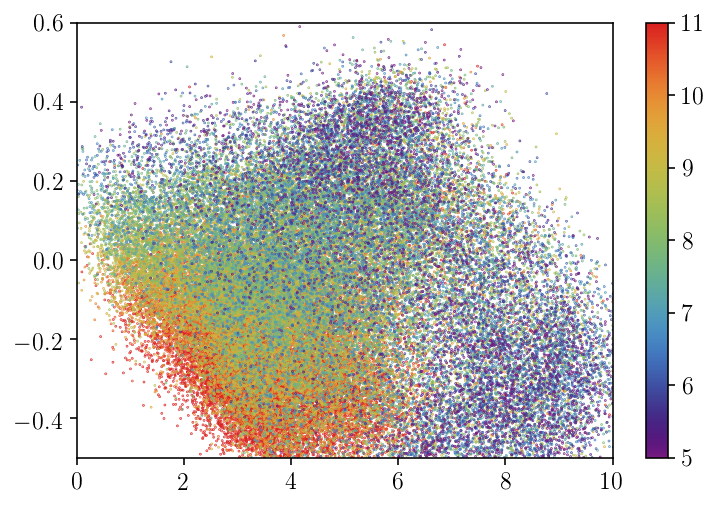

In [38]:
sort = np.argsort((rperi*8.+rap*8.)/2.)[::-1]
plt.scatter(dat['Age'][sort], dat['FE_H'][sort], s=0.1, c=(rperi[sort]*8.+rap[sort]*8.)/2., cmap=cm_rainbow, vmin=5, vmax=11)
plt.xlim(0.,10.)
plt.ylim(-0.5,0.6)
plt.colorbar()

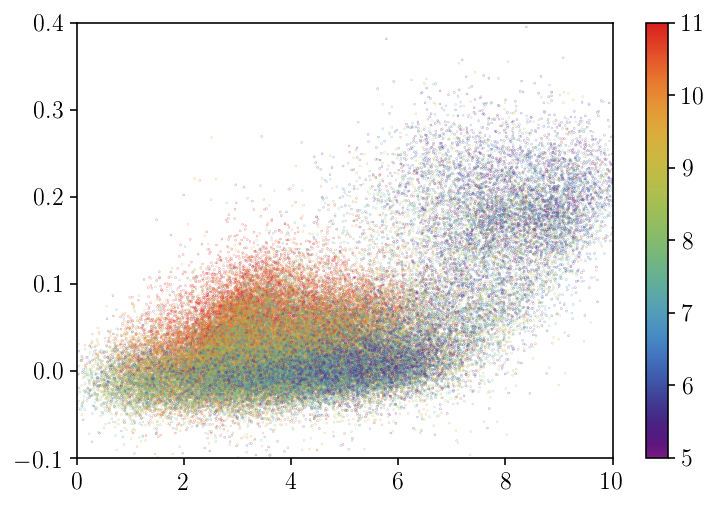

In [54]:
sort = np.argsort((rperi*8.+rap*8.)/2.)[::-1]
plt.scatter(dat['Age'][sort], dat['AVG_ALPHAFE'][sort], s=0.01, c=(rperi[sort]*8.+rap[sort]*8.)/2., cmap=cm_rainbow, vmin=5, vmax=11)
plt.xlim(0.,10.)
plt.ylim(-0.1,0.4)
plt.colorbar()

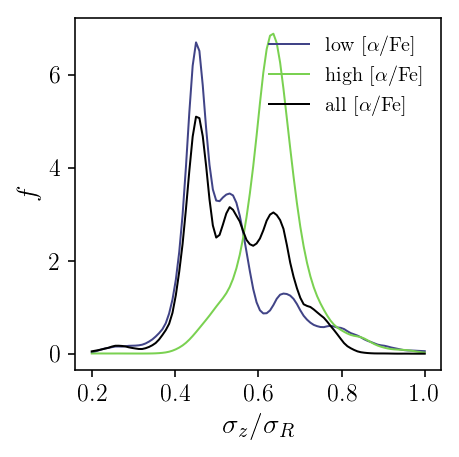

In [55]:
fig = plt.figure()
fig.set_size_inches(columnwidth,columnwidth)
px = np.linspace(0.2,1.,100)

vals = 10**lo_samples[:,:,:,5].ravel()/10**lo_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.2), label=r'$\mathrm{low\ [\alpha/Fe]}$')

vals = 10**hi_samples[:,:,:,5].ravel()/10**hi_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color=plt.cm.viridis(0.8), label=r'$\mathrm{high\ [\alpha/Fe]}$')


vals = 10**co_samples[:,:,:,5].ravel()/10**co_samples[:,:,:,1].ravel()
vals = vals[np.isfinite(vals)]
kde = gaussian_kde(vals)
plt.plot(px,kde(px), color='Black', label=r'$\mathrm{all\ [\alpha/Fe]}$')


plt.xlabel(r'$\sigma_{z}/\sigma_{R}$')
plt.ylabel(r'$f$')
plt.legend(frameon=False, loc=1)
fig.tight_layout()
plt.savefig('../plots/sigmazsigmaR_samples_astronn_dist.png', format='png', dpi=400)
plt.savefig('../plots/sigmazsigmaR_samples_astronn_dist.pdf', format='pdf', dpi=400)





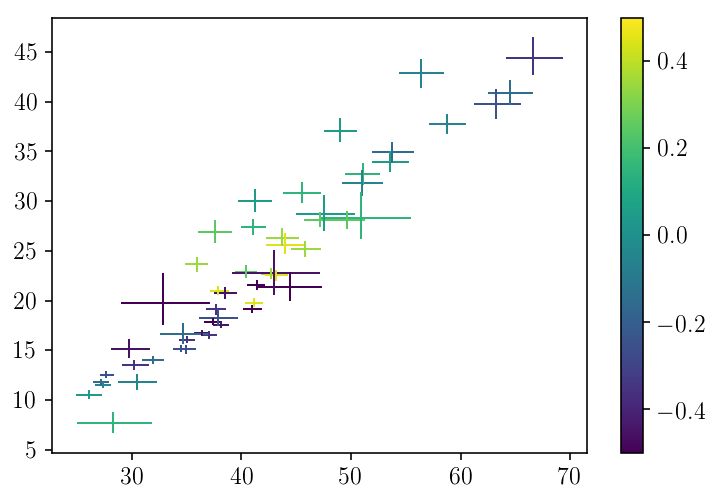

In [56]:
xerr = np.dstack([10**co_par[:,:,5,1].ravel()-10**co_par[:,:,5,0].ravel(), 10**co_par[:,:,5,2].ravel()-10**co_par[:,:,5,1].ravel()])[0].T
yerr = np.dstack([10**co_par[:,:,1,1].ravel()-10**co_par[:,:,1,0].ravel(), 10**co_par[:,:,1,2].ravel()-10**co_par[:,:,1,1].ravel()])[0].T

import matplotlib.colors as mplc
c_m = plt.cm.viridis
cNorm  = mplc.Normalize(vmin=-0.5, vmax=0.5)
s_m = plt.cm.ScalarMappable(norm=cNorm, cmap=c_m)
s_m.set_array([])
#plt.scatter(10**lo_par[:,:,5,1].ravel(),10**lo_par[:,:,1,1].ravel(), c=s_m.to_rgba(fehgrid.ravel()), s=10, zorder=2, lw=0.)
plt.errorbar(10**co_par[:,:,1,1].ravel(),10**co_par[:,:,5,1].ravel(),yerr=xerr, xerr=yerr,fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()), zorder=1)
plt.colorbar(s_m)

In [58]:
print('hello')

hello


/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



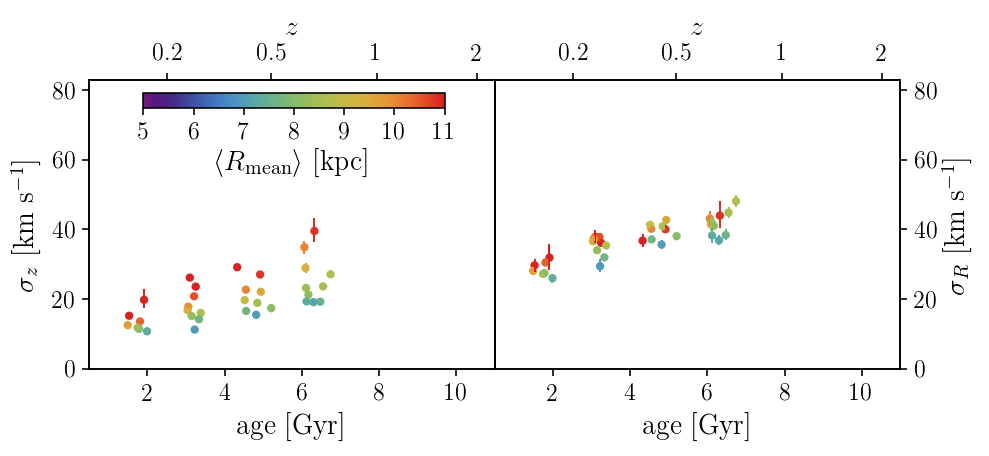

In [21]:
jitter = np.random.randn(len(agegrid.ravel()))



norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)


ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()[mask]-10**lo_par[:,:,1,0].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**lo_par[:,:,1,1].ravel()[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



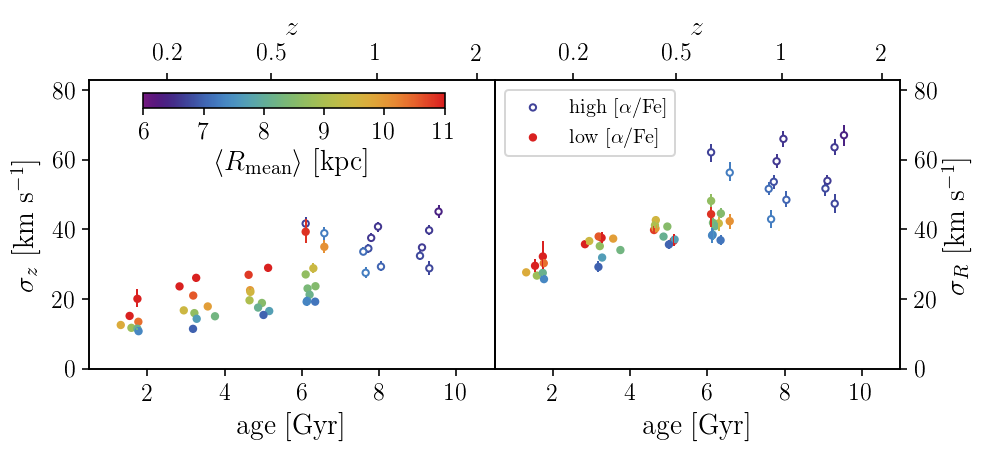

In [20]:
jitter = np.random.randn(len(agegrid.ravel()))



norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,5,1].ravel()[mask]-10**hi_par[:,:,5,0].ravel()[mask], 10**hi_par[:,:,5,2].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**hi_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1.,zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)



ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()[mask]-10**hi_par[:,:,1,0].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**hi_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.) , facecolor='White', zorder=2, label=r'$\mathrm{high\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()[mask]-10**lo_par[:,:,1,0].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**lo_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) , label=r'$\mathrm{low\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

ax[1].legend(frameon=True)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)


#plt.savefig('../plots/sigma_z_sigma_R_age_alphasplit.png', format='png', dpi=400, bbox_inches='tight')
#plt.savefig('../plots/sigma_z_sigma_R_age_alphasplit.pdf', format='pdf', dpi=400, bbox_inches='tight')






[ 1.77804189 47.06960493]
[ 2.12917785 40.45447703]
[ 2.23617901 33.52538817]
[ 1.81970182 33.87159618]
[ 2.0770752  28.76811361]
[ 1.93754646 28.50920202]
[ 2.11445961 25.73503025]
[ 2.18790319 23.75062791]
[ 1.25556592 27.96952993]
[ 4.85275579 44.67064954]
[17.88543769 39.22132471]


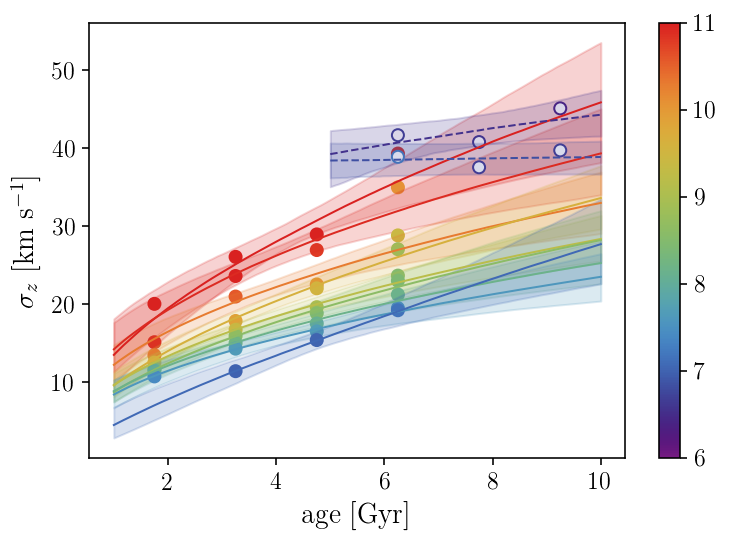

In [29]:
import emcee


def powerlaw(age,beta,sigma_10):
    return sigma_10*(age/10)**(beta)

def lnlike(theta, x, y, yerr):
    beta, sigma_10 = theta
    model = powerlaw(x,1/beta, sigma_10)
    inv_sigma2 = 1./yerr
    return -0.5*(np.sum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

def lnprior(theta):
    beta, sigma_10 = theta
    if -5.0 < 1/beta < 5. and 0.0 < sigma_10 < 100.0:
        return 0.0
    return -np.inf

def lnprob(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr)

norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
betas = np.ones(len(agegrid[0,:]))*np.nan
beta_errs = np.ones(len(agegrid[0,:]))*np.nan
meanrmean = np.ones(len(agegrid[0,:]))*np.nan
meanrmean_r = np.ones(len(agegrid[0,:]))*np.nan
fehs = np.ones(len(agegrid[0,:]))*np.nan
betasampls = []
for i in range(len(agegrid[0,:])):
    nbins = lo_nbins[:,i]
    if (nbins < 200).all():
        continue
    x = agegrid[:,0]
    y = 10**lo_par[:,:,5,1][:,i]
    mask = np.isfinite(y) & (nbins > 200)
    if np.sum(mask) < 3:
        continue
    yerr = 10**lo_par[:,:,5,2][:,i]-10**lo_par[:,:,5,0][:,i]
    import scipy.optimize as op
    nll = lambda *args: -lnlike(*args)
    result = op.minimize(nll, [1/0.2,20.], args=(x[mask], y[mask], yerr[mask]))
    beta, sigma_10 = result["x"]
    print(result['x'])
    ndim, nwalkers = 2, 100
    pos = [result["x"] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(x[mask], y[mask], yerr[mask]))
    sampler.run_mcmc(pos, 100)
    samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
    beta = np.median(1/samples[:,0])
    sigma_10 = np.median(samples[:,1])
    ages = np.linspace(1.,10.,100)
    profiles = np.empty((len(samples), len(ages)))
    for k in range(len(profiles)):
        profiles[k] = powerlaw(ages,1/samples[k,0], samples[k,1])
    prof = np.median(profiles,axis=0)
    up = np.percentile(profiles, 95, axis=0)
    low = np.percentile(profiles, 5, axis=0)
    betas[i] = beta
    beta_errs[i] = np.std(1/samples[:,0])
    meanrmean[i] = np.mean(lo_rmean[:,i][mask]*8.)
    meanrmean_r[i] = np.std(lo_rmean[:,i][mask]*8.)
    fehs[i] = fehgrid[0,:][i]
    betasampls.extend(samples[:,0])
    plt.scatter(x[mask], y[mask], c=(s_m.to_rgba(lo_rmean[:,i][mask]*8.)))
    plt.plot(ages,prof, color=(s_m.to_rgba(np.mean(lo_rmean[:,i][mask]*8.))))
    plt.fill_between(ages, up, low, color=(s_m.to_rgba(np.mean(lo_rmean[:,i][mask]*8.))), alpha=0.2)

hbetas = np.ones(len(agegrid[0,:]))*np.nan
hbeta_errs = np.ones(len(agegrid[0,:]))*np.nan
hmeanrmean = np.ones(len(agegrid[0,:]))*np.nan
hmeanrmean_r = np.ones(len(agegrid[0,:]))*np.nan
hfehs = np.ones(len(agegrid[0,:]))*np.nan
hbetasampls = []
for i in range(len(agegrid[0,:])):
    nbins = hi_nbins[:,i]
    if (nbins < 200).all():
        continue
    x = agegrid[:,0]
    y = 10**hi_par[:,:,5,1][:,i]
    mask = np.isfinite(y) & (nbins > 200)
    if np.sum(mask) < 3:
        continue
    yerr = 10**hi_par[:,:,5,2][:,i]-10**hi_par[:,:,5,0][:,i]
    import scipy.optimize as op
    nll = lambda *args: -lnlike(*args)
    result = op.minimize(nll, [1/0.2,20.], args=(x[mask], y[mask], yerr[mask]))
    beta, sigma_10 = result["x"]
    print(result['x'])
    ndim, nwalkers = 2, 100
    pos = [result["x"] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(x[mask], y[mask], yerr[mask]))
    sampler.run_mcmc(pos, 100)
    samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
    beta = np.median(1/samples[:,0])
    sigma_10 = np.median(samples[:,1])
    ages = np.linspace(5.,10.,100)
    profiles = np.empty((len(samples), len(ages)))
    for k in range(len(profiles)):
        profiles[k] = powerlaw(ages,1/samples[k,0], samples[k,1])
    prof = np.median(profiles,axis=0)
    up = np.percentile(profiles, 95, axis=0)
    low = np.percentile(profiles, 5, axis=0)
    hbetas[i] = beta
    hbeta_errs[i] = np.std(1/samples[:,0])
    hmeanrmean[i] = np.mean(hi_rmean[:,i][mask]*8.)
    hmeanrmean_r[i] = np.std(hi_rmean[:,i][mask]*8.)
    hfehs[i] = fehgrid[0,:][i]
    hbetasampls.extend(samples[:,0])
    
    plt.scatter(x[mask], y[mask], edgecolor=(s_m.to_rgba(hi_rmean[:,i][mask]*8.)), facecolor='White')
    plt.plot(ages,prof, color=(s_m.to_rgba(np.mean(hi_rmean[:,i][mask]*8.))), linestyle='dashed')
    plt.fill_between(ages, up, low, color=(s_m.to_rgba(np.mean(hi_rmean[:,i][mask]*8.))), alpha=0.2)

plt.colorbar(s_m)
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$\sigma_z\ \mathrm{[km\ s^{-1}]}$')
zbetas = betas
zbeta_errs = beta_errs

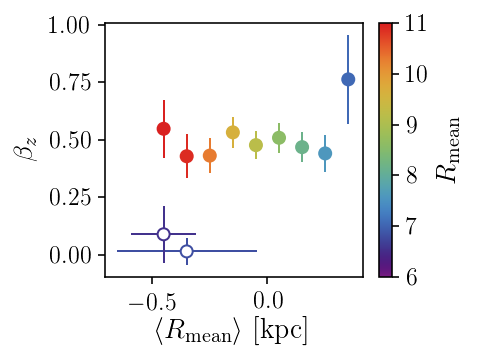

In [22]:
fig = plt.figure()
fig.set_size_inches(columnwidth,0.8*columnwidth)
norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
mask = np.isfinite(fehs)
plt.errorbar(fehs[mask], betas[mask], yerr=beta_errs[mask], fmt='None', ecolor=s_m.to_rgba(meanrmean[mask]))
plt.scatter(fehs[mask], betas[mask], c=s_m.to_rgba(meanrmean[mask]))
plt.xlabel(r'$\langle R_{\mathrm{mean}} \rangle\ \mathrm{[kpc]}$')
plt.colorbar(s_m, label=r'$R_{\mathrm{mean}}$')
plt.ylabel(r'$\beta_z$')
mask = np.isfinite(hfehs)
plt.errorbar(hfehs[mask], hbetas[mask], yerr=hbeta_errs[mask], xerr=hmeanrmean_r[mask], fmt='None', ecolor=s_m.to_rgba(hmeanrmean[mask]), zorder=1)
plt.scatter(hfehs[mask], hbetas[mask], edgecolor=s_m.to_rgba(hmeanrmean[mask]), facecolor='White',zorder=2)
fig.tight_layout()

In [258]:
print(np.nanmedian(1./np.array(hbetasampls)))
t = np.percentile(1./np.array(hbetasampls), [16,50,84])
print(t[1]-t[0], t[2]-t[1])

0.02399581495493847
0.02539393386773307 0.12421598866514844


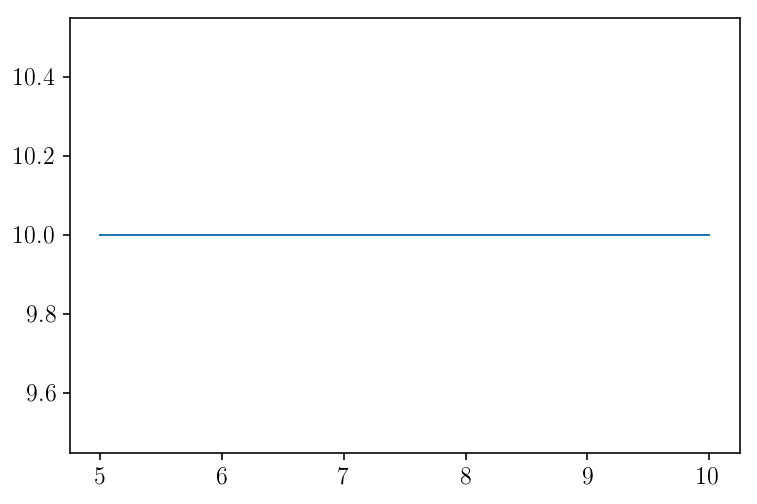

[ 5.41085916 44.9925383 ]
[ 4.24309497 47.21062115]
[ 3.93321831 48.58166131]
[ 2.76654016 56.33704607]
[ 2.68267507 54.22205382]
[ 2.75696014 51.86495858]
[ 3.22694587 47.72071363]
[ 3.04058673 46.2326164 ]
[ 2.86462524 44.4859379 ]
[ 5.06815737 68.6269463 ]
[ 3.20878612 64.91158574]


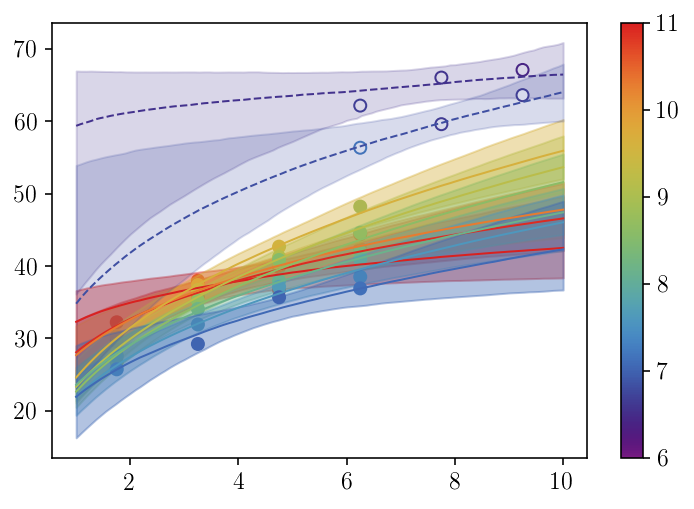

In [30]:
import emcee

def lnlike(theta, x, y, yerr):
    beta, sigma_10 = theta
    model = powerlaw(x,1/beta, sigma_10)
    inv_sigma2 = 1./yerr
    return -0.5*(np.sum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

def lnprior(theta):
    beta, sigma_10 = theta
    if -5.0 < 1/beta < 5. and 0.0 < sigma_10 < 100.0:
        return 0.0
    return -np.inf

def lnprob(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr)

norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
betas = np.ones(len(agegrid[0,:]))*np.nan
beta_errs = np.ones(len(agegrid[0,:]))*np.nan
meanrmean = np.ones(len(agegrid[0,:]))*np.nan
meanrmean_r = np.ones(len(agegrid[0,:]))*np.nan
fehs = np.ones(len(agegrid[0,:]))*np.nan
for i in range(len(agegrid[0,:])):
    nbins = lo_nbins[:,i]
    if (nbins < 200).all():
        continue
    x = agegrid[:,0]
    y = 10**lo_par[:,:,1,1][:,i]
    mask = np.isfinite(y) & (nbins > 200)
    if np.sum(mask) < 3:
        continue
    yerr = 10**lo_par[:,:,1,2][:,i]-10**lo_par[:,:,1,0][:,i]
    import scipy.optimize as op
    nll = lambda *args: -lnlike(*args)
    result = op.minimize(nll, [1/0.2,20.], args=(x[mask], y[mask], yerr[mask]))
    beta, sigma_10 = result["x"]
    print(result['x'])
    ndim, nwalkers = 2, 100
    pos = [result["x"] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(x[mask], y[mask], yerr[mask]))
    sampler.run_mcmc(pos, 100)
    samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
    beta = np.median(1/samples[:,0])
    sigma_10 = np.median(samples[:,1])
    ages = np.linspace(1.,10.,100)
    profiles = np.empty((len(samples), len(ages)))
    for k in range(len(profiles)):
        profiles[k] = powerlaw(ages,1/samples[k,0], samples[k,1])
    prof = np.median(profiles,axis=0)
    up = np.percentile(profiles, 95, axis=0)
    low = np.percentile(profiles, 5, axis=0)
    betas[i] = beta
    beta_errs[i] = np.std(1/samples[:,0])
    meanrmean[i] = np.mean(lo_rmean[:,i][mask]*8.)
    meanrmean_r[i] = np.std(lo_rmean[:,i][mask]*8.)
    fehs[i] = fehgrid[0,:][i]
    plt.scatter(x[mask], y[mask], c=(s_m.to_rgba(lo_rmean[:,i][mask]*8.)))
    plt.plot(ages,prof, color=(s_m.to_rgba(np.mean(lo_rmean[:,i][mask]*8.))))
    plt.fill_between(ages, up, low, color=(s_m.to_rgba(np.mean(lo_rmean[:,i][mask]*8.))), alpha=0.4)

hbetas = np.ones(len(agegrid[0,:]))*np.nan
hbeta_errs = np.ones(len(agegrid[0,:]))*np.nan
hmeanrmean = np.ones(len(agegrid[0,:]))*np.nan
hmeanrmean_r = np.ones(len(agegrid[0,:]))*np.nan
hfehs = np.ones(len(agegrid[0,:]))*np.nan
hbetasamples = []
for i in range(len(agegrid[0,:])):
    nbins = hi_nbins[:,i]
    if (nbins < 200).all():
        continue
    x = agegrid[:,0]
    y = 10**hi_par[:,:,1,1][:,i]
    mask = np.isfinite(y) & (nbins > 200)
    if np.sum(mask) < 3:
        continue
    yerr = 10**hi_par[:,:,1,2][:,i]-10**hi_par[:,:,1,0][:,i]
    import scipy.optimize as op
    nll = lambda *args: -lnlike(*args)
    result = op.minimize(nll, [1/0.2,20.], args=(x[mask], y[mask], yerr[mask]))
    beta, sigma_10 = result["x"]
    print(result['x'])
    ndim, nwalkers = 2, 100
    pos = [result["x"] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(x[mask], y[mask], yerr[mask]))
    sampler.run_mcmc(pos, 100)
    samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
    beta = np.median(1/samples[:,0])
    sigma_10 = np.median(samples[:,1])
    ages = np.linspace(1.,10.,100)
    profiles = np.empty((len(samples), len(ages)))
    for k in range(len(profiles)):
        profiles[k] = powerlaw(ages,1/samples[k,0], samples[k,1])
    prof = np.median(profiles,axis=0)
    up = np.percentile(profiles, 95, axis=0)
    low = np.percentile(profiles, 5, axis=0)
    hbetas[i] = beta
    hbeta_errs[i] = np.std(1/samples[:,0])
    hmeanrmean[i] = np.mean(hi_rmean[:,i][mask]*8.)
    hmeanrmean_r[i] = np.std(hi_rmean[:,i][mask]*8.)
    hfehs[i] = fehgrid[0,:][i]
    hbetasamples.extend(samples[:,0])
    plt.scatter(x[mask], y[mask], edgecolor=(s_m.to_rgba(hi_rmean[:,i][mask]*8.)), facecolor='White')
    plt.plot(ages,prof, color=(s_m.to_rgba(np.mean(hi_rmean[:,i][mask]*8.))), linestyle='dashed')
    plt.fill_between(ages, up, low, color=(s_m.to_rgba(np.mean(hi_rmean[:,i][mask]*8.))), alpha=0.2)

plt.colorbar(s_m)

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



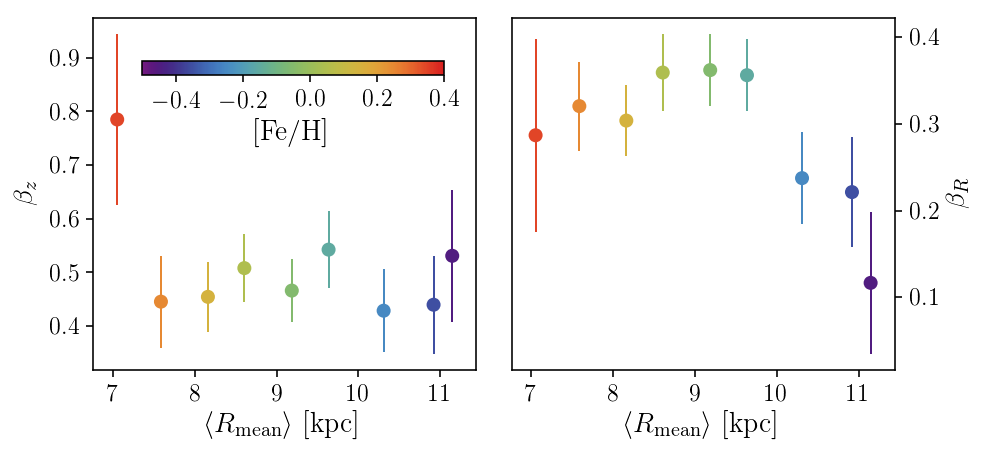

In [42]:
fig, ax  = plt.subplots(1,2, sharex=True)
fig.set_size_inches(textwidth,columnwidth)
norm = matplotlib.colors.Normalize(
    vmin=-0.5,
    vmax=0.4)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
mask = np.isfinite(fehs)
ax[1].errorbar(meanrmean[mask], betas[mask], yerr=beta_errs[mask], fmt='None', ecolor=s_m.to_rgba(fehs[mask]))
ax[1].scatter(meanrmean[mask], betas[mask], c=s_m.to_rgba(fehs[mask]))
ax[1].set_xlabel(r'$\langle R_{\mathrm{mean}} \rangle\ \mathrm{[kpc]}$')
#pl1.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
ax[1].set_ylabel(r'$\beta_R$')
#ax[0].set_xticks([-0.4,-0.2,0.,0.2,0.4])

ax[0].errorbar(meanrmean[mask], zbetas[mask], yerr=zbeta_errs[mask], fmt='None', ecolor=s_m.to_rgba(fehs[mask]))
ax[0].scatter(meanrmean[mask], zbetas[mask], c=s_m.to_rgba(fehs[mask]))
ax[0].set_xlabel(r'$\langle R_{\mathrm{mean}} \rangle\ \mathrm{[kpc]}$')
#pl0.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\beta_z$')
#ax[1].set_xticks([-0.4,-0.2,0.,0.2,0.4])

ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

cax = fig.add_axes([0.15,0.82,0.3,0.03])
plt.colorbar(s_m, cax=cax, label=r'$\mathrm{[Fe/H]}$', orientation='horizontal', ticks=[-0.4,-0.2,0.,0.2,0.4])
#mask = np.isfinite(hfehs)
#plt.errorbar(hfehs[mask], hbetas[mask], yerr=hbeta_errs[mask], fmt='None', ecolor=s_m.to_rgba(hmeanrmean[mask]), zorder=1)
#plt.scatter(hfehs[mask], hbetas[mask], edgecolor=s_m.to_rgba(hmeanrmean[mask]), facecolor='White',zorder=2)
fig.tight_layout()
plt.savefig('../plots/beta_r_mean.png', format='png', dpi=400, bbox_inches='tight')
plt.savefig('../plots/beta_r_mean.pdf', format='pdf', dpi=400, bbox_inches='tight')

In [268]:
print(np.nanmedian(1./np.array(hbetasamples)))
t = np.percentile(1./np.array(hbetasamples), [16,50,84])
print(t[1]-t[0], t[2]-t[1])

0.16895940790480987
0.1235526309956069 0.15436105858490115


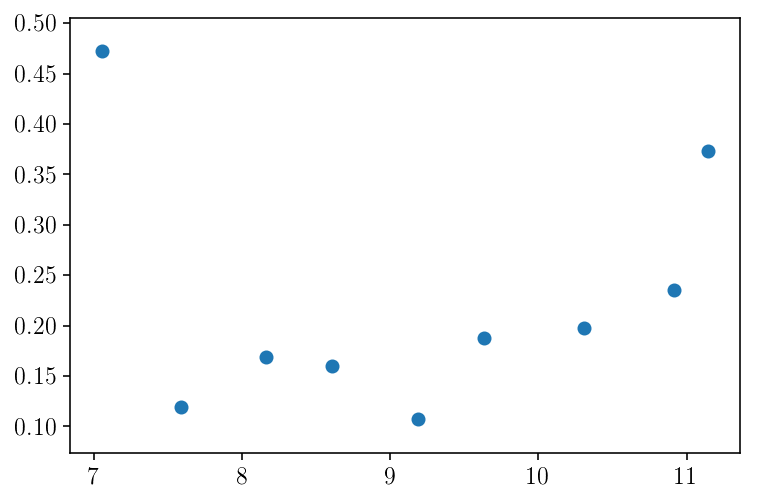

In [211]:
plt.scatter(meanrmean,zbetas-betas)

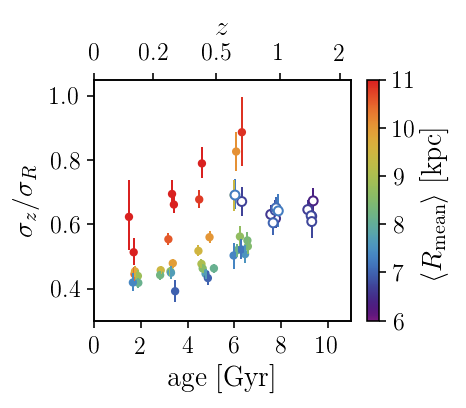

In [41]:
norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,0].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask], 10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**lo_par[:,:,5,1].ravel()[mask]/10**lo_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**lo_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**lo_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,0].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask], 10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**hi_par[:,:,5,1].ravel()[mask]/10**hi_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**hi_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**hi_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.ylim(0.3,1.05)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()


plt.savefig('../plots/sigma_z_R_age_rmean_alphasplit.png', format='png', dpi=400, bbox_inches='tight')
plt.savefig('../plots/sigma_z_R_age_rmean_alphasplit.pdf', format='pdf', dpi=400, bbox_inches='tight')



array([[       nan, 0.00710279, 0.00580851, 0.0060944 , 0.00575712,
        0.00503535, 0.00478619, 0.00472102, 0.00378299, 0.00258352,
        0.00152186],
       [0.01901372, 0.0185142 , 0.01284772, 0.00954004, 0.00863583,
        0.00798209, 0.00769145, 0.00768401, 0.00682205, 0.00475704,
        0.0031716 ],
       [0.02764374, 0.03288565, 0.01979205, 0.01443168, 0.0127311 ,
        0.01111153, 0.01119184, 0.00943944, 0.00896191, 0.0092884 ,
        0.00880232],
       [0.        , 0.04753822, 0.04149984, 0.02889941, 0.02367007,
        0.02118814, 0.01561795, 0.01424396, 0.01336391, 0.01179172,
        0.01165945],
       [       nan, 0.08499783, 0.04796546, 0.03968583, 0.02767712,
        0.0302626 , 0.02343291, 0.02318352, 0.01297359, 0.01475988,
        0.0146479 ],
       [       nan,        nan, 0.04672973, 0.04838321, 0.01447493,
        0.00986952, 0.01649061, 0.00079167,        nan,        nan,
        0.        ],
       [       nan,        nan,        nan,        nan,   

In [6]:
def sigma_R(R,ihsig,sig):
    return sig*np.exp((R-8.)*ihsig)

Rs = np.linspace(3.,13.,100)
profs = np.empty((len(lo_samples[3,3]),100))
for i in range(len(lo_samples[3,3])):
    sig = 10**lo_samples[3,3,i,1]
    ihsig = lo_samples[3,3,i,0]
    profs[i] = sigma_R(Rs,ihsig,sig)

HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

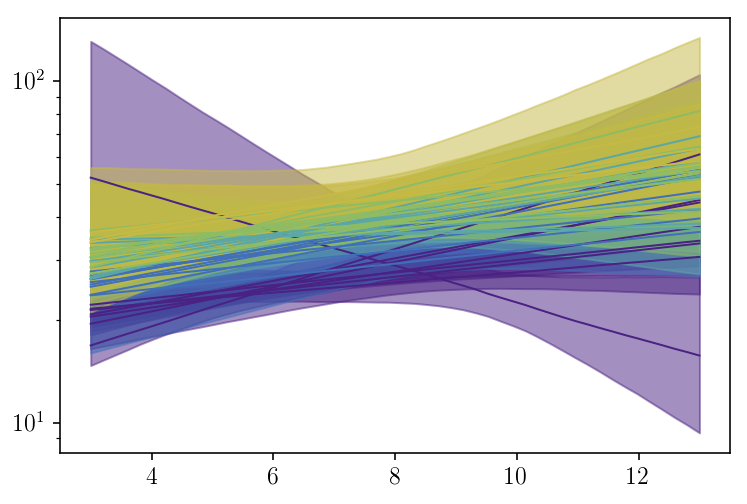

In [7]:
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)):
    for j in range(len(fehbins)-1):
        profs = np.empty((len(co_samples[i,j]),50))
        for k in range(len(co_samples[i,j])):
            sig = 10**lo_samples[i,j,k,1]
            ihsig = lo_samples[i,j,k,0]
            profs[k] = sigma_R(Rs,ihsig,sig)
        plt.plot(Rs,np.median(profs,axis=0), color=s_m.to_rgba(agecents[i]))
        plt.fill_between(Rs, np.percentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agecents[i]), alpha=0.5)
plt.yscale('log')

HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

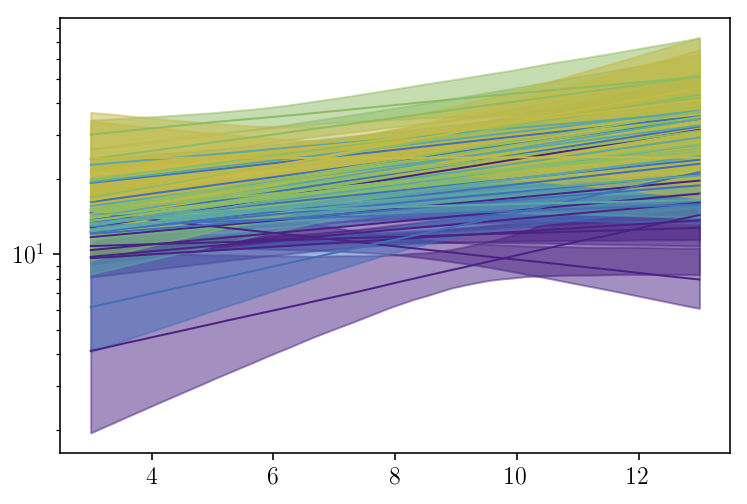

In [10]:
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)):
    for j in range(len(fehbins)-1):
        profs = np.empty((len(co_samples[i,j]),50))
        for k in range(len(co_samples[i,j])):
            sig = 10**lo_samples[i,j,k,5]
            ihsig = lo_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig,sig)
        plt.plot(Rs,np.median(profs,axis=0), color=s_m.to_rgba(agecents[i]))
        plt.fill_between(Rs, np.percentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.5)
plt.yscale('log')

HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

Text(0,0.5,'$\\sigma_z(R)\\ \\mathrm{[km\\ s^{-1}]}$')

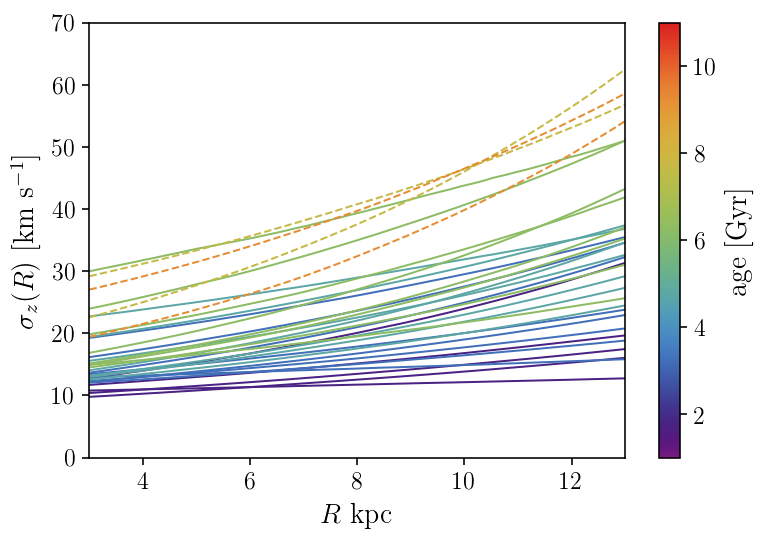

In [29]:
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)): 
    for j in range(len(fehbins)-1):
        profs = np.empty((len(lo_samples[i,j]),50))
        signif = np.median(lo_samples[i,j,:,0])/np.std(lo_samples[i,j,:,0])
        if signif < 2:
            continue
        for k in range(len(lo_samples[i,j])):
            sig = 10**lo_samples[i,j,k,5]
            ihsig = lo_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig,sig)
        plt.plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        profs = np.empty((len(hi_samples[i,j]),50))
        signif = np.median(hi_samples[i,j,:,0])/np.std(hi_samples[i,j,:,0])
        if signif < 2:
            continue
        for k in range(len(hi_samples[i,j])):
            sig = 10**hi_samples[i,j,k,5]
            ihsig = hi_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig,sig)
        plt.plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]),linestyle='dashed')
        #plt.fill_between(Rs, np.nanpercentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.4)
plt.ylim(0.,70.)
plt.xlim(3.,13.)
plt.colorbar(s_m, label=r'$\mathrm{age\ [Gyr]}$')
plt.xlabel(r'$R\ \mathrm{kpc}$')
plt.ylabel(r'$\sigma_z(R)\ \mathrm{[km\ s^{-1}]}$')

HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

Text(0,0.5,'$\\sigma_R(R)\\ \\mathrm{[km\\ s^{-1}]}$')

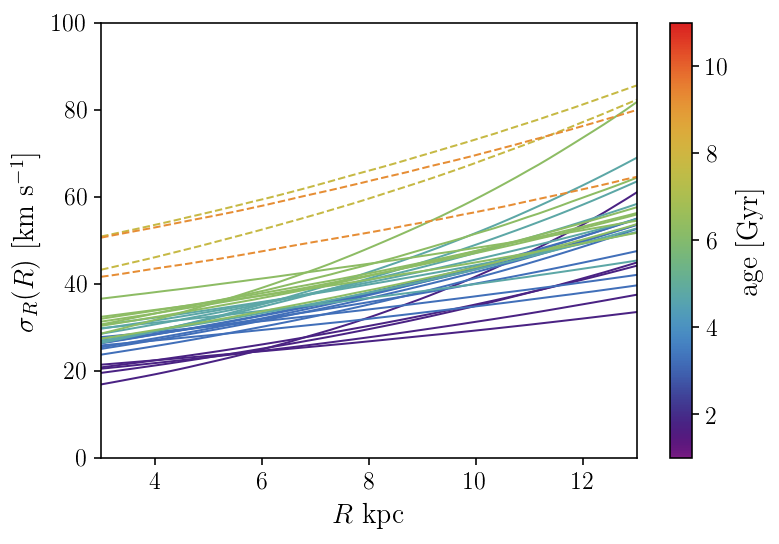

In [24]:
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)): 
    for j in range(len(fehbins)-1):
        profs = np.empty((len(lo_samples[i,j]),50))
        signif = np.median(lo_samples[i,j,:,0])/np.std(lo_samples[i,j,:,0])
        if signif < 2:
            continue
        for k in range(len(lo_samples[i,j])):
            sig = 10**lo_samples[i,j,k,1]
            ihsig = lo_samples[i,j,k,0]
            profs[k] = sigma_R(Rs,ihsig,sig)
        plt.plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        profs = np.empty((len(hi_samples[i,j]),50))
        signif = np.median(hi_samples[i,j,:,0])/np.std(hi_samples[i,j,:,0])
        if signif < 2:
            continue
        for k in range(len(hi_samples[i,j])):
            sig = 10**hi_samples[i,j,k,1]
            ihsig = hi_samples[i,j,k,0]
            profs[k] = sigma_R(Rs,ihsig,sig)
        plt.plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]), linestyle='dashed')
        #plt.fill_between(Rs, np.nanpercentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.4)
plt.ylim(0.,100.)
plt.xlim(3.,13.)
plt.colorbar(s_m, label=r'$\mathrm{age\ [Gyr]}$')
plt.xlabel(r'$R\ \mathrm{kpc}$')
plt.ylabel(r'$\sigma_R(R)\ \mathrm{[km\ s^{-1}]}$')

HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

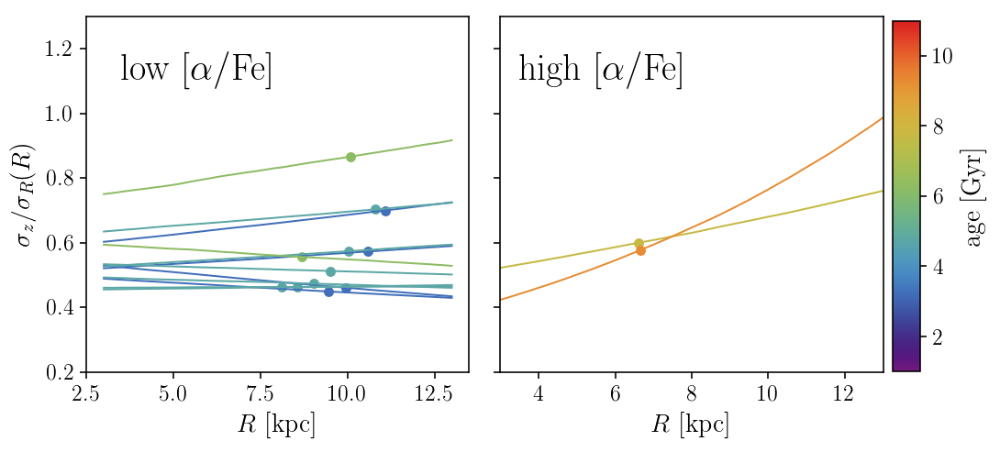

In [92]:
fig, ax = plt.subplots(1,2, sharey=True)
fig.set_size_inches(textwidth,columnwidth)
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)): 
    for j in range(len(fehbins)-1):
        profs = np.empty((len(lo_samples[i,j]),50))
        profrmean = np.empty(len(lo_samples[i,j]))
        med = np.median((lo_samples[i,j,:,4]))
        std = np.percentile((lo_samples[i,j,:,4]), [16,84])
        signif = 1/np.fabs(med/(std[1]-std[0]))
        if signif > 0.4:
            continue
        for k in range(len(lo_samples[i,j])):
            sig = 10**lo_samples[i,j,k,1]
            ihsig = lo_samples[i,j,k,0]
            sig1 = 10**lo_samples[i,j,k,5]
            ihsig1 = lo_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig1,sig1)/sigma_R(Rs,ihsig,sig)
            profrmean[k] = sigma_R(lo_rmean[i,j]*8.,ihsig1,sig1)/sigma_R(lo_rmean[i,j]*8.,ihsig,sig)
        ax[0].plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[0].scatter(lo_rmean[i,j]*8., np.nanmedian(profrmean), color=s_m.to_rgba(agegrid[i,j]), s=20)
        profs = np.empty((len(hi_samples[i,j]),50))
        profrmean = np.empty(len(hi_samples[i,j]))
        med = np.median((hi_samples[i,j,:,4]))
        std = np.percentile((hi_samples[i,j,:,4]), [16,84])
        signif = 1/np.fabs(med/(std[1]-std[0]))
        if signif > 0.4:
            continue
        for k in range(len(hi_samples[i,j])):
            sig = 10**hi_samples[i,j,k,1]
            ihsig = hi_samples[i,j,k,0]
            sig1 = 10**hi_samples[i,j,k,5]
            ihsig1 = hi_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig1,sig1)/sigma_R(Rs,ihsig,sig)
            profrmean[k] = sigma_R(hi_rmean[i,j]*8.,ihsig1,sig1)/sigma_R(hi_rmean[i,j]*8.,ihsig,sig)
        ax[1].plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[1].scatter(hi_rmean[i,j]*8., np.nanmedian(profrmean), color=s_m.to_rgba(agegrid[i,j]), s=20)
        #plt.fill_between(Rs, np.nanpercentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.4)
plt.ylim(0.2,1.3)
plt.xlim(3.,13.)
fig.tight_layout()
fig.subplots_adjust(right=0.93)
cax = fig.add_axes([0.94,0.13,0.03,0.8])
plt.colorbar(s_m, cax =cax, label=r'$\mathrm{age\ [Gyr]}$')
ax[0].set_xlabel(r'$R\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$R\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\sigma_z/\sigma_R(R)$')
ax[0].text(3.5,1.1,r'$\mathrm{low\ [\alpha/Fe]}$',fontsize=20)
ax[1].text(3.5,1.1,r'$\mathrm{high\ [\alpha/Fe]}$', fontsize=20)


plt.savefig('../plots/sigma_z_R_profiles_alphasplit.png', format='png', dpi=400, bbox_inches='tight')
plt.savefig('../plots/sigma_z_R_profiles_alphasplit.pdf', format='pdf', dpi=400, bbox_inches='tight')



HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

Text(3.5,55,'$\\mathrm{high\\ [\\alpha/Fe]}$')

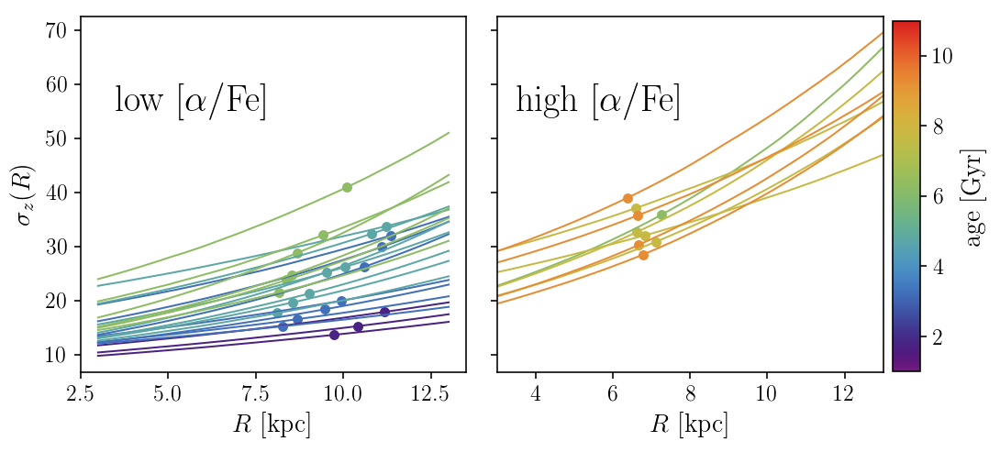

In [45]:
fig, ax = plt.subplots(1,2, sharey=True)
fig.set_size_inches(textwidth,columnwidth)
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)): 
    for j in range(len(fehbins)-1):
        profs = np.empty((len(lo_samples[i,j]),50))
        profrmean = np.empty(len(lo_samples[i,j]))
        signif = np.median(lo_samples[i,j,:,4])/np.std(lo_samples[i,j,:,4])
        if signif < 3:
            continue
        for k in range(len(lo_samples[i,j])):
            sig = 10**lo_samples[i,j,k,1]
            ihsig = lo_samples[i,j,k,0]
            sig1 = 10**lo_samples[i,j,k,5]
            ihsig1 = lo_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig1,sig1)
            profrmean[k] = sigma_R(lo_rmean[i,j]*8.,ihsig1,sig1)
        ax[0].plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[0].scatter(lo_rmean[i,j]*8., np.nanmedian(profrmean), color=s_m.to_rgba(agegrid[i,j]), s=20)
        profs = np.empty((len(hi_samples[i,j]),50))
        profrmean = np.empty(len(hi_samples[i,j]))
        signif = np.median(hi_samples[i,j,:,4])/np.std(hi_samples[i,j,:,4])
        if signif < 3:
            continue
        for k in range(len(hi_samples[i,j])):
            sig = 10**hi_samples[i,j,k,1]
            ihsig = hi_samples[i,j,k,0]
            sig1 = 10**hi_samples[i,j,k,5]
            ihsig1 = hi_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig1,sig1)
            profrmean[k] = sigma_R(hi_rmean[i,j]*8.,ihsig1,sig1)
        ax[1].plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[1].scatter(hi_rmean[i,j]*8., np.nanmedian(profrmean), color=s_m.to_rgba(agegrid[i,j]), s=20)
        #plt.fill_between(Rs, np.nanpercentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.4)

plt.xlim(3.,13.)
fig.tight_layout()
fig.subplots_adjust(right=0.93)
cax = fig.add_axes([0.94,0.13,0.03,0.8])
plt.colorbar(s_m, cax =cax, label=r'$\mathrm{age\ [Gyr]}$')
ax[0].set_xlabel(r'$R\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$R\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\sigma_z(R)$')
ax[0].text(3.5,55,r'$\mathrm{low\ [\alpha/Fe]}$',fontsize=20)
ax[1].text(3.5,55,r'$\mathrm{high\ [\alpha/Fe]}$', fontsize=20)




HBox(children=(IntProgress(value=0, max=8), HTML(value='')))

Text(3.5,55,'$\\mathrm{high\\ [\\alpha/Fe]}$')

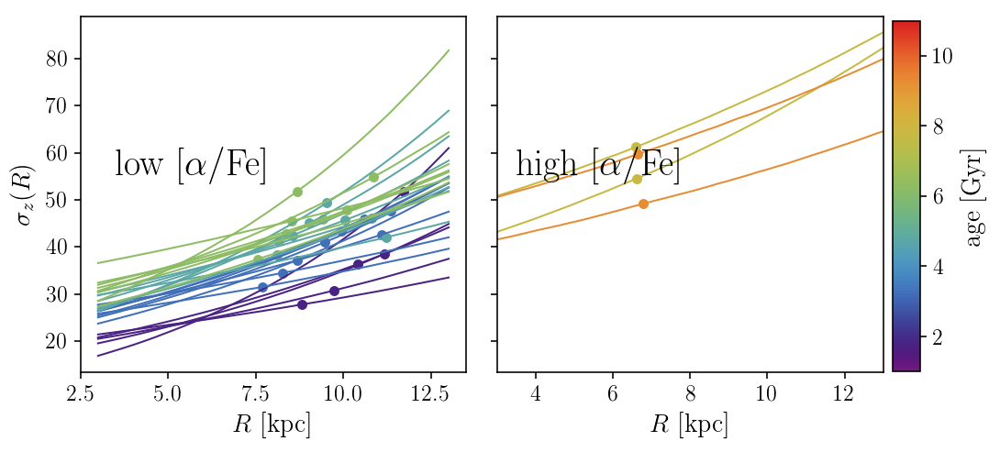

In [47]:
fig, ax = plt.subplots(1,2, sharey=True)
fig.set_size_inches(textwidth,columnwidth)
norm = matplotlib.colors.Normalize(
    vmin=1,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

Rs = np.linspace(3.,13.,50)

agecents = (agebins[:-1]+agebins[1:])/2.

for i in tqdm.tqdm_notebook(range(len(agebins)-1)): 
    for j in range(len(fehbins)-1):
        profs = np.empty((len(lo_samples[i,j]),50))
        profrmean = np.empty(len(lo_samples[i,j]))
        signif = np.median(lo_samples[i,j,:,0])/np.std(lo_samples[i,j,:,0])
        if signif < 2:
            continue
        for k in range(len(lo_samples[i,j])):
            sig = 10**lo_samples[i,j,k,1]
            ihsig = lo_samples[i,j,k,0]
            sig1 = 10**lo_samples[i,j,k,5]
            ihsig1 = lo_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig,sig)
            profrmean[k] = sigma_R(lo_rmean[i,j]*8.,ihsig,sig)
        ax[0].plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[0].scatter(lo_rmean[i,j]*8., np.nanmedian(profrmean), color=s_m.to_rgba(agegrid[i,j]), s=20)
        profs = np.empty((len(hi_samples[i,j]),50))
        profrmean = np.empty(len(hi_samples[i,j]))
        signif = np.median(hi_samples[i,j,:,0])/np.std(hi_samples[i,j,:,0])
        if signif < 2:
            continue
        for k in range(len(hi_samples[i,j])):
            sig = 10**hi_samples[i,j,k,1]
            ihsig = hi_samples[i,j,k,0]
            sig1 = 10**hi_samples[i,j,k,5]
            ihsig1 = hi_samples[i,j,k,4]
            profs[k] = sigma_R(Rs,ihsig,sig)
            profrmean[k] = sigma_R(hi_rmean[i,j]*8.,ihsig,sig)
        ax[1].plot(Rs,np.nanmedian(profs,axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[1].scatter(hi_rmean[i,j]*8., np.nanmedian(profrmean), color=s_m.to_rgba(agegrid[i,j]), s=20)
        #plt.fill_between(Rs, np.nanpercentile(profs,5,axis=0), np.percentile(profs,95,axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.4)

plt.xlim(3.,13.)
fig.tight_layout()
fig.subplots_adjust(right=0.93)
cax = fig.add_axes([0.94,0.13,0.03,0.8])
plt.colorbar(s_m, cax =cax, label=r'$\mathrm{age\ [Gyr]}$')
ax[0].set_xlabel(r'$R\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$R\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\sigma_z(R)$')
ax[0].text(3.5,55,r'$\mathrm{low\ [\alpha/Fe]}$',fontsize=20)
ax[1].text(3.5,55,r'$\mathrm{high\ [\alpha/Fe]}$', fontsize=20)




In [47]:
print(np.nanpercentile(lo_samples[:,:,:,9].ravel(), [16,50,84]))
print(np.nanpercentile(hi_samples[:,:,:,9].ravel(), [16,50,84]))

[-0.33092759  0.40000559  1.26689571]
[-0.46408669  0.22424906  0.93554359]


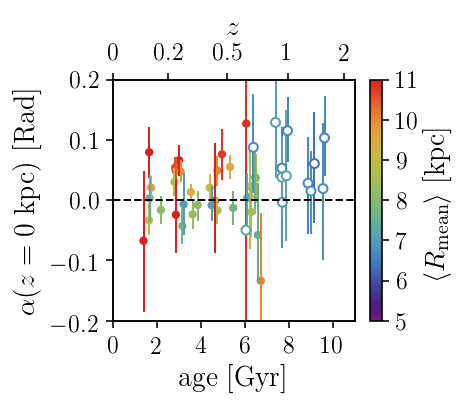

In [85]:
# agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

par = np.arctan(lo_par[:,:,8,1].ravel()+lo_par[:,:,9,1].ravel()*(0./8.))
alpha1_e = np.dstack([lo_par[:,:,9,1].ravel()-lo_par[:,:,9,0].ravel(), lo_par[:,:,9,2].ravel()-lo_par[:,:,9,1].ravel()])[0].T
alpha0_e = np.dstack([lo_par[:,:,8,1].ravel()-lo_par[:,:,8,0].ravel(), lo_par[:,:,8,2].ravel()-lo_par[:,:,8,1].ravel()])[0].T
z_e = np.dstack([lo_med_z[:,:,2].ravel()-lo_med_z[:,:,1].ravel(), lo_med_z[:,:,3].ravel()-lo_med_z[:,:,2].ravel()])[0].T
a = (1/(par**2+1))**2*alpha0_e**2
b = (lo_med_z[:,:,2].ravel()/(8.*(par**2+1)))**2*alpha1_e**2
c = (lo_par[:,:,9,1].ravel()/(8.*(par**2+1)))**2*z_e**2
err = np.sqrt(a)#+b+c)


fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
err = np.dstack([err[0][mask], err[1][mask]])[0].T
yerr = np.dstack([lo_par[:,:,9,1].ravel()[mask]-lo_par[:,:,9,0].ravel()[mask], lo_par[:,:,9,2].ravel()[mask]-lo_par[:,:,9,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,9,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.3*jitter, par[mask], s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.3*jitter, par[mask], yerr=err, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

par = np.arctan(hi_par[:,:,8,1].ravel()+hi_par[:,:,9,1].ravel()*(0./8.))
alpha1_e = np.dstack([hi_par[:,:,9,1].ravel()-hi_par[:,:,9,0].ravel(), hi_par[:,:,9,2].ravel()-hi_par[:,:,9,1].ravel()])[0].T
alpha0_e = np.dstack([hi_par[:,:,8,1].ravel()-hi_par[:,:,8,0].ravel(), hi_par[:,:,8,2].ravel()-hi_par[:,:,8,1].ravel()])[0].T
z_e = np.dstack([hi_med_z[:,:,2].ravel()-hi_med_z[:,:,1].ravel(), hi_med_z[:,:,3].ravel()-hi_med_z[:,:,2].ravel()])[0].T
a = (1/(par**2+1))**2*alpha0_e**2
b = (hi_med_z[:,:,2].ravel()/(8.*(par**2+1)))**2*alpha1_e**2
c = (hi_par[:,:,9,1].ravel()/(8.*(par**2+1)))**2*z_e**2
err = np.sqrt(a)#+b+c)


mask = hi_nbins.ravel() > 200
err = np.dstack([err[0][mask], err[1][mask]])[0].T
yerr = np.dstack([hi_par[:,:,9,1].ravel()[mask]-hi_par[:,:,9,0].ravel()[mask], hi_par[:,:,9,2].ravel()[mask]-hi_par[:,:,9,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,9,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.3*jitter, par[mask], s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.3*jitter, par[mask], yerr=err, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)

plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\alpha(z=0\ \mathrm{kpc})\ \mathrm{[Rad]}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
plt.ylim(-0.2,0.2)
ax = plt.gca()
plt.axhline(0., linestyle='dashed', color='Black')
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



In [88]:
np.nanpercentile(np.arctan(hi_samples[:,:,:,8].ravel()+hi_samples[:,:,:,9].ravel()*(0./8.)), [16,50,84])



array([-0.0686307 ,  0.04862364,  0.15688096])

In [89]:
err[0][mask]

IndexError: boolean index did not match indexed array along dimension 0; dimension is 13 but corresponding boolean dimension is 88

In [63]:
np.median((lo_samples[2,2,:,4]-lo_samples[2,2,:,0]))/np.std((lo_samples[2,2,:,4]-lo_samples[2,2,:,0]))

0.9916281309355706

In [59]:
np.median((10**lo_samples[2,2,:,5])/(10**lo_samples[2,2,:,1]))/np.std((10**lo_samples[2,2,:,5])/(10**lo_samples[2,2,:,1]))

23.936471475253924

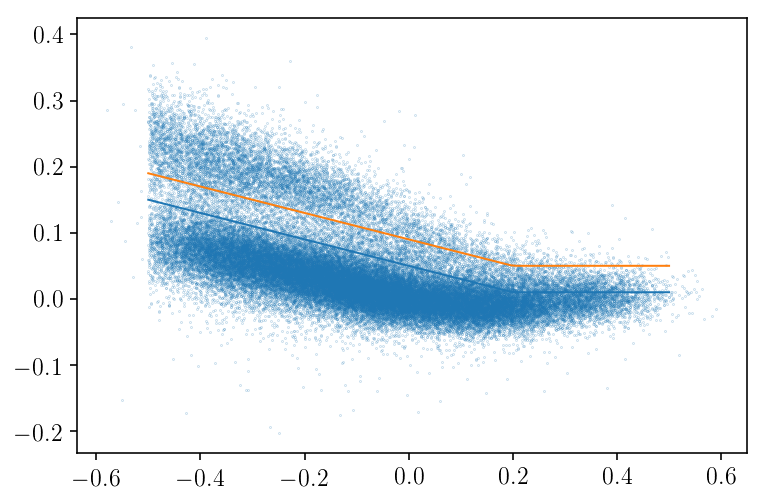

In [42]:
newx = np.linspace(-0.5,0.5,100)
plt.scatter(dat['FE_H'], dat['AVG_ALPHAFE'], s=0.01)
plt.plot(newx,define_rgbsample.alphaedge(newx))
plt.plot(newx,define_rgbsample.alphaedge(newx)+0.04)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


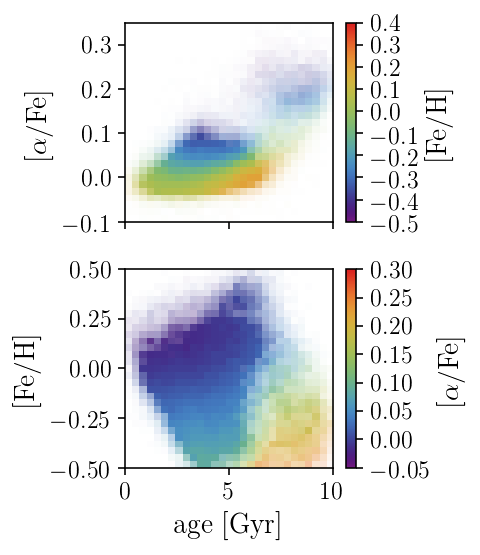

In [162]:
fig, ax = plt.subplots(2,1,sharex=True)
fig.set_size_inches(1.*columnwidth,1.2*columnwidth)

norm = matplotlib.colors.Normalize(vmin=-0.5,vmax=0.4)
s_m1 = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m1.set_array([]) 
xbins,ybins = np.linspace(0.,10.,30), np.linspace(-0.1,0.35,30)
hist, xedges, yedges = np.histogram2d(dat['Age'], dat['AVG_ALPHAFE'], bins=[xbins,ybins])
mhist, xedges, yedges = np.histogram2d(dat['Age'], dat['AVG_ALPHAFE'], bins=[xbins,ybins], weights=dat['FE_H'])
colors = s_m1.to_rgba((np.rot90(mhist/hist)))
colors[:,:,3] = np.rot90(hist/(0.3*np.max(hist)))
ax[0].imshow(colors, extent=[0.,10.,-0.1,0.35], aspect='auto')
#s1 = ax[0].scatter(dat['Age'], dat['AVG_ALPHAFE'], lw=0., s=2, c=dat['FE_H'], vmin=-0.5,vmax=0.4, cmap=cm_rainbow, rasterized=True)
norm = matplotlib.colors.Normalize(vmin=-0.05,vmax=0.3)
s_m2 = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m2.set_array([]) 
xbins,ybins = np.linspace(0.,10.,30), np.linspace(-0.5,0.5,30)
hist, xedges, yedges = np.histogram2d(dat['Age'], dat['FE_H'], bins=[xbins,ybins])
mhist, xedges, yedges = np.histogram2d(dat['Age'], dat['FE_H'], bins=[xbins,ybins], weights=dat['AVG_ALPHAFE'])
colors = s_m2.to_rgba((np.rot90(mhist/hist)))
colors[:,:,3] = np.rot90(hist/(0.3*np.max(hist)))
ax[1].imshow(colors, extent=[0.,10.,-0.5,0.5], aspect='auto')
#s2 = ax[1].scatter(dat['Age'], dat['FE_H'], lw=0., s=2, c=dat['AVG_ALPHAFE'], vmin=-0.05,vmax=0.3, cmap=cm_rainbow, rasterized=True)
ax[1].set_xlim(0.,10.)
ax[1].set_ylim(-0.5,0.5)
ax[0].set_ylim(-0.1,0.35)
ax[0].set_yticks([-0.1,0,0.1,0.2,0.3])
ax[0].set_ylabel(r'$\mathrm{[\alpha/Fe]}$')
ax[1].set_ylabel(r'$\mathrm{[Fe/H]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.colorbar(s_m1, ax=ax[0], label=r'$\mathrm{[Fe/H]}$')
plt.colorbar(s_m2, ax=ax[1], label=r'$\mathrm{[\alpha/Fe]}$')

fig.tight_layout()
plt.savefig('../plots/GaiaAPOGEE_agefehafe.pdf', format='pdf')
plt.savefig('../plots/GaiaAPOGEE_agefehafe.png', format='png', dpi=400)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


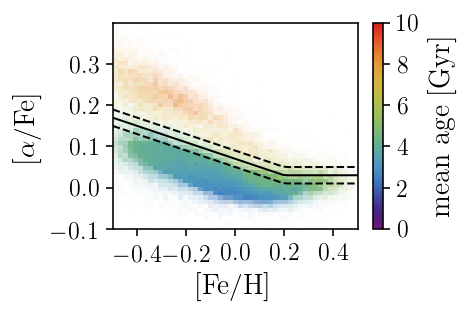

In [164]:
tafebins = np.linspace(-0.1,0.35,50)
tfehbins = np.linspace(-0.5,0.5,50)
norm = matplotlib.colors.Normalize(vmin=0.,vmax=10.)
s_m1 = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m1.set_array([]) 
fig = plt.figure()
fig.set_size_inches(columnwidth,0.7*columnwidth)
hist, yedges, xedges = np.histogram2d(dat['FE_H'], dat['AVG_ALPHAFE'], bins=[tfehbins,tafebins])
mhist, yedges, xedges = np.histogram2d(dat['FE_H'], dat['AVG_ALPHAFE'], bins=[tfehbins,tafebins], weights=dat['Age'])
colors = s_m1.to_rgba((np.rot90(mhist/hist)))
colors[:,:,3] = np.rot90(hist/(0.3*np.max(hist)))
plt.imshow(colors, extent=[-0.5,0.5,-0.1,0.4], aspect='auto', interpolation='Nearest')
plt.colorbar(s_m1,label=r'$\mathrm{mean\ age\ [Gyr]}$')
plt.plot(tfehbins, define_rgbsample.alphaedge(tfehbins)+0.04, color='Black', linestyle='dashed')
plt.plot(tfehbins, define_rgbsample.alphaedge(tfehbins), color='Black', linestyle='dashed')
plt.plot(tfehbins, define_rgbsample.alphaedge(tfehbins)+0.02, color='Black')
plt.xticks([-0.4,-0.2,0.,0.2,0.4])
plt.yticks([-0.1,0.,0.1,0.2,0.3])
plt.xlabel(r'$\mathrm{[Fe/H]}$')
plt.ylabel(r'$\mathrm{[\alpha/Fe]}$')
fig.tight_layout()

plt.savefig('../plots/afe_feh_meanage.png', format='png', dpi=400)
plt.savefig('../plots/afe_feh_meanage.pdf', format='pdf', dpi=400)



In [165]:
co_par[:,:,-1]

array([[[       nan,        nan,        nan],
        [       nan,        nan,        nan],
        [0.00219095, 0.00669603, 0.01837175],
        [0.00041242, 0.00172262, 0.004214  ],
        [0.00169326, 0.00314503, 0.00521166],
        [0.00056409, 0.00135182, 0.00279643],
        [0.00101127, 0.00265749, 0.00517868],
        [0.00299934, 0.00569814, 0.00959182],
        [0.00983233, 0.01692034, 0.02629939],
        [0.00945142, 0.02259185, 0.04731289],
        [       nan,        nan,        nan]],

       [[       nan,        nan,        nan],
        [0.00048886, 0.00201537, 0.00502766],
        [0.00127006, 0.00254392, 0.00428562],
        [0.00161677, 0.00263361, 0.00394748],
        [0.00115399, 0.00197989, 0.00306536],
        [0.00188988, 0.0031742 , 0.00461883],
        [0.00073236, 0.00217914, 0.00428749],
        [0.00140775, 0.00297362, 0.00534725],
        [0.0004915 , 0.00219631, 0.00538405],
        [0.00304876, 0.00933426, 0.02109909],
        [       nan,        nan,

In [55]:
s_m

In [60]:
colors

array([[[0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        ...,
        [0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf]],

       [[0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        ...,
        [0.30668072, 0.11747645, 0.50558021,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf]],

       [[0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        [0.472     , 0.108932  , 0.50761421,       -inf],
        ...,
        [0.29652242, 0.12749249, 0.51103218,       -inf],
        [0.28768689, 0.138843

No handles with labels found to put in legend.


/home/astjmack/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  



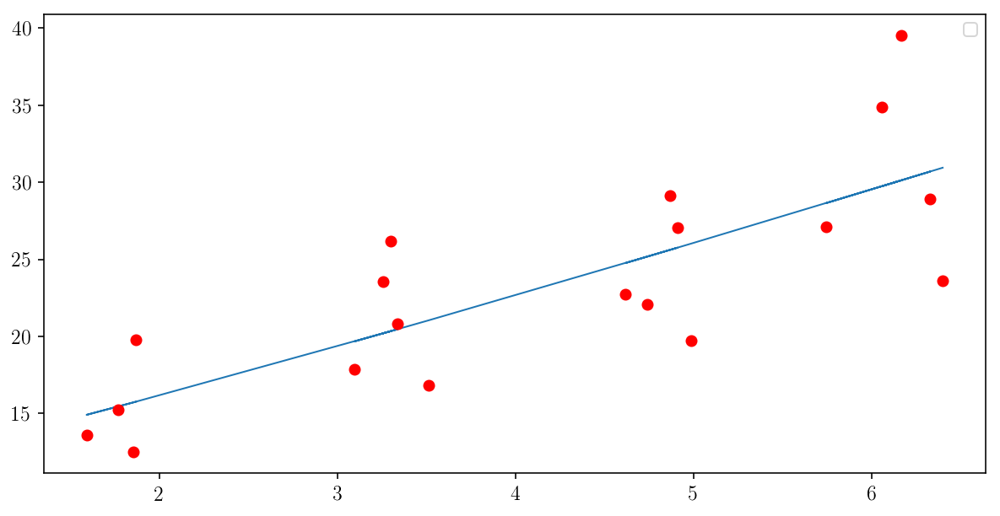

In [116]:
from scipy.optimize import curve_fit
def func_powerlaw(x, m, c, c0):
    return c0 + x**m * c


xs =np.linspace(0.,10.,100.)


jitter = np.random.randn(len(agegrid.ravel()))
mask = (lo_nbins.ravel() > 200) & (fehgrid.ravel() <= 0.)
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]

popt, pcov = curve_fit(func_powerlaw, x, y)

plt.figure(figsize=(10, 5))
plt.plot(x, func_powerlaw(x, *popt))
plt.plot(x, y, 'ro')
plt.legend()
plt.show()

In [117]:
popt

array([ 1.10722522,  2.61281403, 10.54074101])

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



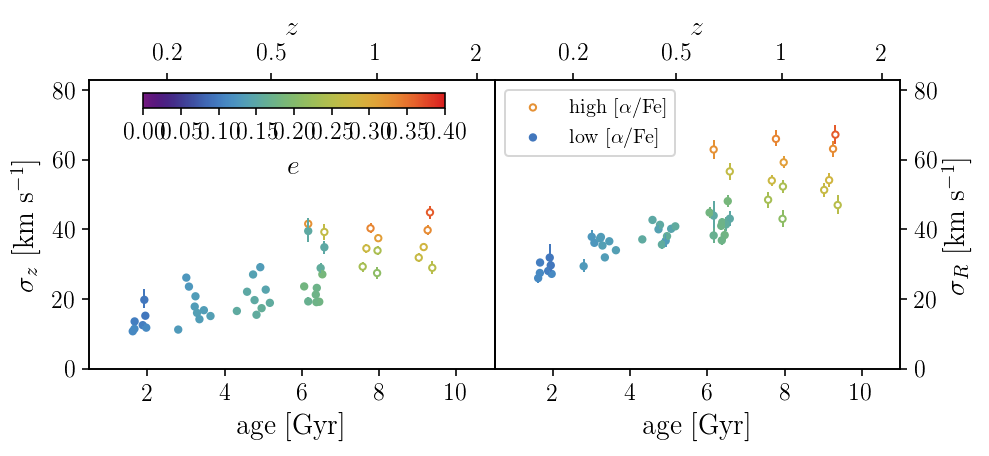

In [129]:
jitter = np.random.randn(len(agegrid.ravel()))



norm = matplotlib.colors.Normalize(
    vmin=0.,
    vmax=0.4)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,5,1].ravel()[mask]-10**hi_par[:,:,5,0].ravel()[mask], 10**hi_par[:,:,5,2].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**hi_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_ecc.ravel()[mask]), facecolor='White', zorder=2)
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_ecc.ravel()[mask]), lw=1.,zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(lo_ecc.ravel()[mask]) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_ecc.ravel()[mask]), lw=1.)



ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()[mask]-10**hi_par[:,:,1,0].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**hi_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_ecc.ravel()[mask]) , facecolor='White', zorder=2, label=r'$\mathrm{high\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_ecc.ravel()[mask]), lw=1., zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()[mask]-10**lo_par[:,:,1,0].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**lo_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(lo_ecc.ravel()[mask]) , label=r'$\mathrm{low\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_ecc.ravel()[mask]), lw=1.)

ax[1].legend(frameon=True)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$e$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)

/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



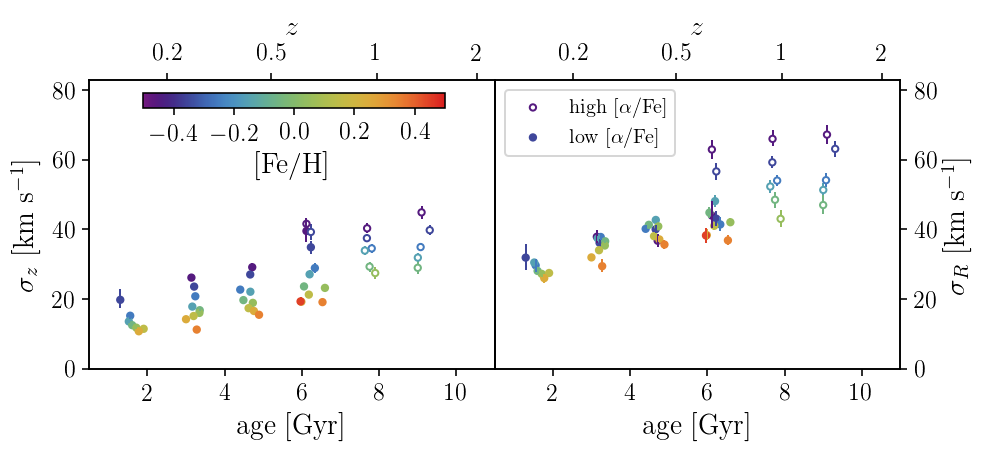

In [148]:
jitter = np.random.randn(len(agegrid.ravel()))



norm = matplotlib.colors.Normalize(
    vmin=-0.5,
    vmax=0.5)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,5,1].ravel()[mask]-10**hi_par[:,:,5,0].ravel()[mask], 10**hi_par[:,:,5,2].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**hi_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, edgecolor=s_m.to_rgba(fehgrid.ravel()[mask]), facecolor='White', zorder=2)
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()[mask]), lw=1., zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(fehgrid.ravel()[mask]) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()[mask]), lw=1.)



ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()[mask]-10**hi_par[:,:,1,0].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**hi_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, edgecolor=s_m.to_rgba(fehgrid.ravel()[mask]) , facecolor='White', zorder=2, label=r'$\mathrm{high\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()[mask]), lw=1., zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()[mask]-10**lo_par[:,:,1,0].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**lo_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(fehgrid.ravel()[mask]) , label=r'$\mathrm{low\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()[mask]), lw=1.)

ax[1].legend(frameon=True)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\mathrm{[Fe/H]}$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)

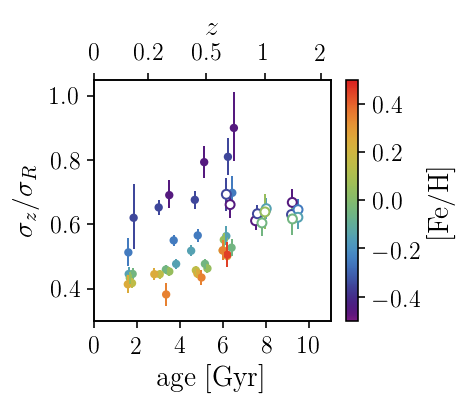

In [130]:
norm = matplotlib.colors.Normalize(
    vmin=-0.5,
    vmax=0.5)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,0].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask], 10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**lo_par[:,:,5,1].ravel()[mask]/10**lo_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**lo_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**lo_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(fehgrid.ravel()[mask]) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()[mask]), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,0].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask], 10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**hi_par[:,:,5,1].ravel()[mask]/10**hi_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**hi_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**hi_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(fehgrid.ravel()[mask]), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(fehgrid.ravel()[mask]), lw=1., zorder=1)
plt.ylim(0.3,1.05)
plt.colorbar(s_m, label=r'$\mathrm{[Fe/H]}$')
plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



In [131]:
np.shape(hi_samples)

(8, 11, 20000, 11)

In [139]:
mask = hi_nbins > 200
t = np.nanpercentile(10**hi_samples[mask][:,:,5].ravel()/10**hi_samples[mask][:,:,1].ravel(), [16,50,84])
t[1]-t[0], t[1], t[2]-t[1]

(0.03975233714070081, 0.6379777912267959, 0.04476625594378536)

In [43]:
if os.path.isfile('../sav/apdr14gaiadr2_astroNN_ages_distances_ellipsoid_monoage_samples.npy'):
    with open('../sav/apdr14gaiadr2_astroNN_ages_distances_ellipsoid_monoage_samples.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        co_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
        co_med_z = np.load(f)
        
agebins = np.arange(1.,14.,1.5)
fehbins = np.arange(-0.6,0.6,0.1)

lo_par = np.empty([len(agebins)-1,len(fehbins)-1,13,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,13,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,13,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.nanpercentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.nanpercentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.nanpercentile(co_samples[i,j], [16,50,84], axis=0).T
        
co_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
co_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
co_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
co_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])



for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        co_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]/2.)
        lo_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))]/2.)
        hi_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)]/2.)
        co_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]/2.)
        lo_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1019: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)



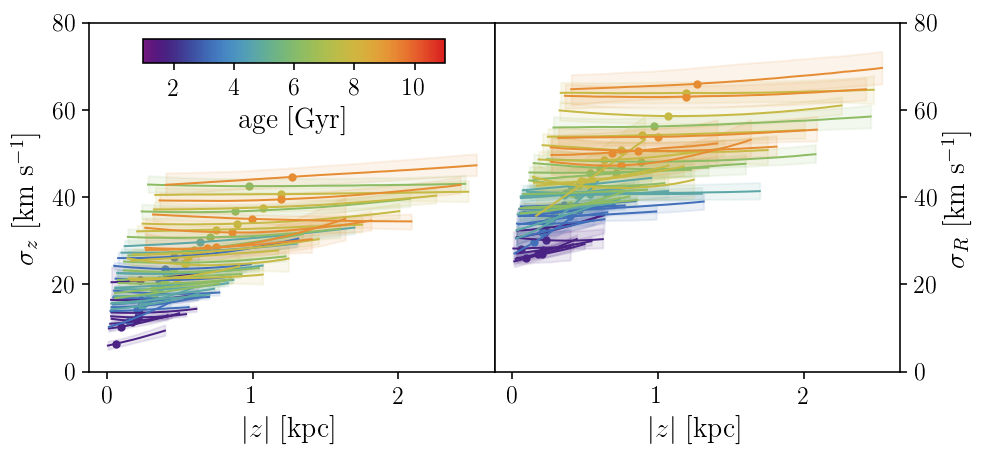

In [72]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))


def sigma_profile(zs, a,b,c,med_z):
    prof = a*(zs-med_z)**2+b*(zs-med_z)+c
    return prof

def gen_sigma_profs(samples, med_z, sigmar=False):
    zs = np.linspace(med_z[0], med_z[4], 50)
    profs = np.zeros([len(samples),len(zs)])
    mz = med_z[2]
    for i in range(len(samples)):
        if sigmar:
            profs[i] = sigma_profile(zs, samples[i,2], samples[i,3], 10**samples[i,1], mz)
        else:
            profs[i] = sigma_profile(zs, samples[i,6], samples[i,7], 10**samples[i,5], mz)
    return zs, profs
  
norm = matplotlib.colors.Normalize(
    vmin=1.,
    vmax=11.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([])   

fig,ax = plt.subplots(1,2, sharex=True)
fig.set_size_inches(textwidth,columnwidth)
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        zs, profs = gen_sigma_profs(co_samples[i,j], co_med_z[i,j])
        ax[0].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[0].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
        ax[0].scatter(co_med_z[i,j,2], 10**np.median(co_samples[i,j,:,5]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        zs, profs = gen_sigma_profs(co_samples[i,j], co_med_z[i,j], sigmar=True)
        ax[1].plot(zs, np.median(profs, axis=0), color=s_m.to_rgba(agegrid[i,j]))
        ax[1].fill_between(zs, np.percentile(profs, 16, axis=0), np.percentile(profs, 84, axis=0), color=s_m.to_rgba(agegrid[i,j]), alpha=0.1)
        ax[1].scatter(co_med_z[i,j,2], 10**np.median(co_samples[i,j,:,1]), color=s_m.to_rgba(agegrid[i,j]), s=10)
        
ax[0].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[1].set_xlabel(r'$|z|\ \mathrm{[kpc]}$')
ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_ylim(0.,80.)
ax[1].set_ylim(0.,80.)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax= fig.add_axes([0.15,0.85,0.3,0.05])
plt.colorbar(s_m, cax=cax,label=r'$\mathrm{age\ [Gyr]}$', orientation='horizontal')



/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



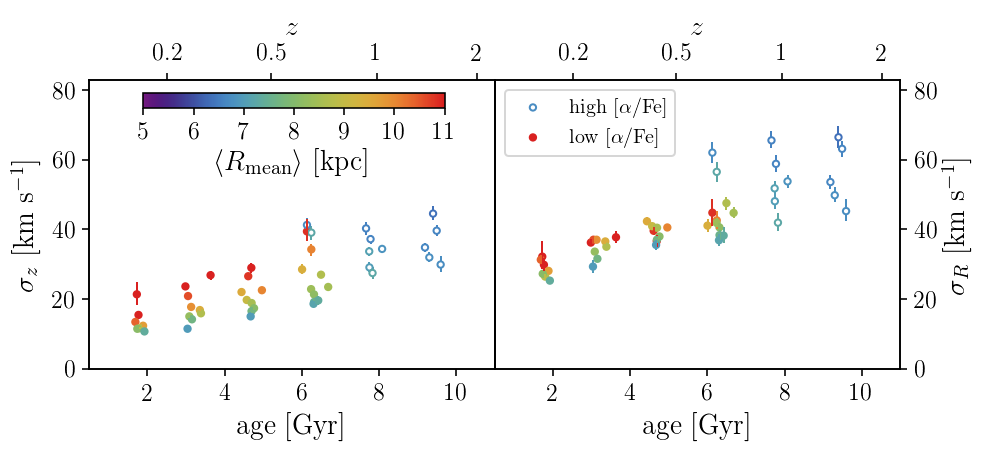

In [27]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))



jitter = np.random.randn(len(agegrid.ravel()))



norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,5,1].ravel()[mask]-10**hi_par[:,:,5,0].ravel()[mask], 10**hi_par[:,:,5,2].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**hi_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1.,zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)



ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()[mask]-10**hi_par[:,:,1,0].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**hi_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.) , facecolor='White', zorder=2, label=r'$\mathrm{high\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()[mask]-10**lo_par[:,:,1,0].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**lo_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) , label=r'$\mathrm{low\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

ax[1].legend(frameon=True)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)



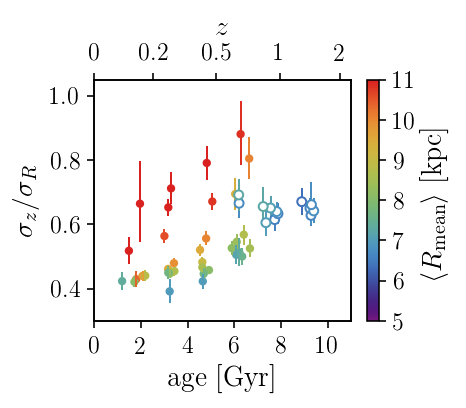

In [28]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,0].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask], 10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**lo_par[:,:,5,1].ravel()[mask]/10**lo_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**lo_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**lo_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,0].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask], 10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**hi_par[:,:,5,1].ravel()[mask]/10**hi_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**hi_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**hi_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.ylim(0.3,1.05)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()




[ 1.83363664 47.20662367]
[ 2.35314048 38.5278098 ]
[ 2.29111531 33.08697378]
[ 1.81316825 33.82240942]
[ 2.03498167 29.03607265]
[ 1.92786889 28.45895326]
[ 2.12458062 25.57337777]
[ 2.21607489 23.43319171]
[ 1.33827115 26.37370495]
[ 5.20622838 44.18182587]
[24.37707753 38.91253938]


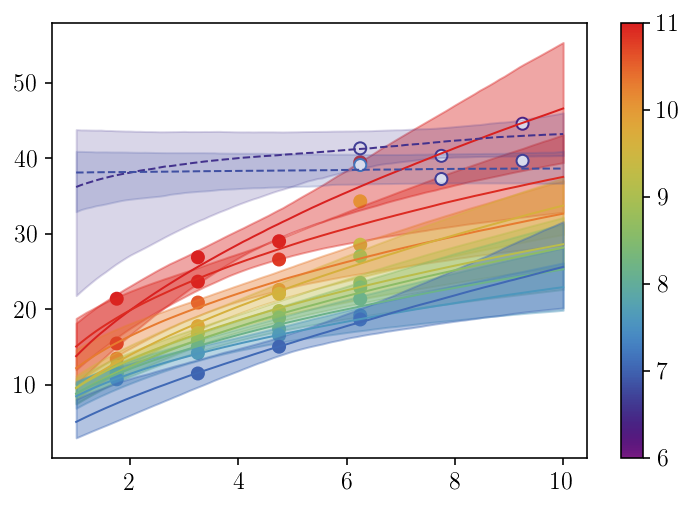

In [35]:
import emcee

def powerlaw(age,beta,sigma_10):
    return sigma_10*(age/10)**(beta)

def lnlike(theta, x, y, yerr):
    beta, sigma_10 = theta
    model = powerlaw(x,1/beta, sigma_10)
    inv_sigma2 = 1./yerr
    return -0.5*(np.sum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

def lnprior(theta):
    beta, sigma_10 = theta
    if -5.0 < 1/beta < 5. and 0.0 < sigma_10 < 100.0:
        return 0.0
    return -np.inf

def lnprob(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr)

norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
betas = np.ones(len(agegrid[0,:]))*np.nan
beta_errs = np.ones(len(agegrid[0,:]))*np.nan
meanrmean = np.ones(len(agegrid[0,:]))*np.nan
meanrmean_r = np.ones(len(agegrid[0,:]))*np.nan
fehs = np.ones(len(agegrid[0,:]))*np.nan
for i in range(len(agegrid[0,:])):
    nbins = lo_nbins[:,i]
    if (nbins < 200).all():
        continue
    x = agegrid[:,0]
    y = 10**lo_par[:,:,5,1][:,i]
    mask = np.isfinite(y) & (nbins > 200)
    if np.sum(mask) < 3:
        continue
    yerr = 10**lo_par[:,:,5,2][:,i]-10**lo_par[:,:,5,0][:,i]
    import scipy.optimize as op
    nll = lambda *args: -lnlike(*args)
    result = op.minimize(nll, [1/0.2,20.], args=(x[mask], y[mask], yerr[mask]))
    beta, sigma_10 = result["x"]
    print(result['x'])
    ndim, nwalkers = 2, 100
    pos = [result["x"] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(x[mask], y[mask], yerr[mask]))
    sampler.run_mcmc(pos, 100)
    samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
    beta = np.median(1/samples[:,0])
    sigma_10 = np.median(samples[:,1])
    ages = np.linspace(1.,10.,100)
    profiles = np.empty((len(samples), len(ages)))
    for k in range(len(profiles)):
        profiles[k] = powerlaw(ages,1/samples[k,0], samples[k,1])
    prof = np.median(profiles,axis=0)
    up = np.percentile(profiles, 95, axis=0)
    low = np.percentile(profiles, 5, axis=0)
    betas[i] = beta
    beta_errs[i] = np.std(1/samples[:,0])
    meanrmean[i] = np.mean(lo_rmean[:,i][mask]*8.)
    meanrmean_r[i] = np.std(lo_rmean[:,i][mask]*8.)
    fehs[i] = fehgrid[0,:][i]
    plt.scatter(x[mask], y[mask], c=(s_m.to_rgba(lo_rmean[:,i][mask]*8.)))
    plt.plot(ages,prof, color=(s_m.to_rgba(np.mean(lo_rmean[:,i][mask]*8.))))
    plt.fill_between(ages, up, low, color=(s_m.to_rgba(np.mean(lo_rmean[:,i][mask]*8.))), alpha=0.4)

hbetas = np.ones(len(agegrid[0,:]))*np.nan
hbeta_errs = np.ones(len(agegrid[0,:]))*np.nan
hmeanrmean = np.ones(len(agegrid[0,:]))*np.nan
hmeanrmean_r = np.ones(len(agegrid[0,:]))*np.nan
hfehs = np.ones(len(agegrid[0,:]))*np.nan
hbetasamples = []
for i in range(len(agegrid[0,:])):
    nbins = hi_nbins[:,i]
    if (nbins < 200).all():
        continue
    x = agegrid[:,0]
    y = 10**hi_par[:,:,5,1][:,i]
    mask = np.isfinite(y) & (nbins > 200)
    if np.sum(mask) < 3:
        continue
    yerr = 10**hi_par[:,:,5,2][:,i]-10**hi_par[:,:,5,0][:,i]
    import scipy.optimize as op
    nll = lambda *args: -lnlike(*args)
    result = op.minimize(nll, [1/0.2,20.], args=(x[mask], y[mask], yerr[mask]))
    beta, sigma_10 = result["x"]
    print(result['x'])
    ndim, nwalkers = 2, 100
    pos = [result["x"] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(x[mask], y[mask], yerr[mask]))
    sampler.run_mcmc(pos, 100)
    samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
    beta = np.median(1/samples[:,0])
    sigma_10 = np.median(samples[:,1])
    ages = np.linspace(1.,10.,100)
    profiles = np.empty((len(samples), len(ages)))
    for k in range(len(profiles)):
        profiles[k] = powerlaw(ages,1/samples[k,0], samples[k,1])
    prof = np.median(profiles,axis=0)
    up = np.percentile(profiles, 95, axis=0)
    low = np.percentile(profiles, 5, axis=0)
    hbetas[i] = beta
    hbeta_errs[i] = np.std(1/samples[:,0])
    hmeanrmean[i] = np.mean(hi_rmean[:,i][mask]*8.)
    hmeanrmean_r[i] = np.std(hi_rmean[:,i][mask]*8.)
    hfehs[i] = fehgrid[0,:][i]
    hbetasamples.extend(samples[:,0])
    plt.scatter(x[mask], y[mask], edgecolor=(s_m.to_rgba(hi_rmean[:,i][mask]*8.)), facecolor='White')
    plt.plot(ages,prof, color=(s_m.to_rgba(np.mean(hi_rmean[:,i][mask]*8.))), linestyle='dashed')
    plt.fill_between(ages, up, low, color=(s_m.to_rgba(np.mean(hi_rmean[:,i][mask]*8.))), alpha=0.2)

plt.colorbar(s_m)

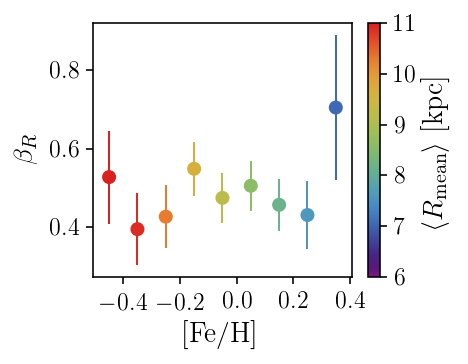

In [36]:
fig = plt.figure()
fig.set_size_inches(columnwidth,0.8*columnwidth)
norm = matplotlib.colors.Normalize(
    vmin=6,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
mask = np.isfinite(fehs)
plt.errorbar(fehs[mask], betas[mask], yerr=beta_errs[mask], fmt='None', ecolor=s_m.to_rgba(meanrmean[mask]))
plt.scatter(fehs[mask], betas[mask], c=s_m.to_rgba(meanrmean[mask]))
plt.xlabel(r'$\mathrm{[Fe/H]}$')
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\beta_R$')
plt.xticks([-0.4,-0.2,0.,0.2,0.4])
#mask = np.isfinite(hfehs)
#plt.errorbar(hfehs[mask], hbetas[mask], yerr=hbeta_errs[mask], fmt='None', ecolor=s_m.to_rgba(hmeanrmean[mask]), zorder=1)
#plt.scatter(hfehs[mask], hbetas[mask], edgecolor=s_m.to_rgba(hmeanrmean[mask]), facecolor='White',zorder=2)
fig.tight_layout()
#plt.savefig('../plots/beta_R_r_mean.png', format='png', dpi=400, bbox_inches='tight')
#plt.savefig('../plots/beta_R_r_mean.pdf', format='pdf', dpi=400, bbox_inches='tight')

In [37]:
len(dat)

65719

In [53]:
np.median(dat['SNR'])

171.99

In [47]:
np.sqrt(np.nanmedian(cov_galcencyl, axis=0))

array([[2.21054153,        nan,        nan],
       [       nan, 2.22932102, 0.05128911],
       [       nan, 0.05128911, 1.05427905]])

In [46]:
np.nanmedian(dat['pmra_error']), np.nanmedian(dat['pmdec_error'])

(0.056944007764455004, 0.04905242216467556)

In [52]:
np.nanmedian(dat['pc_error'])/np.nanmedian(dat['pc'])

0.0976107980583904

In [15]:
import corner

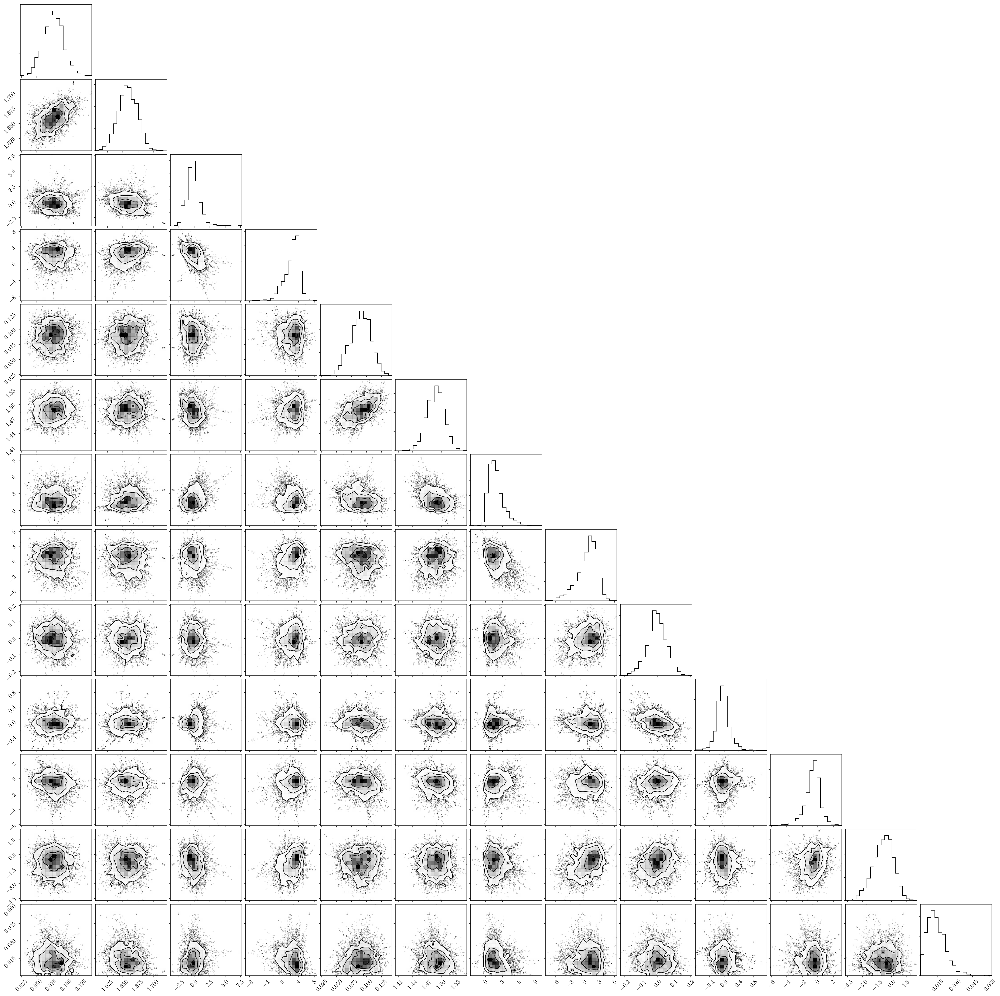

In [19]:
fig = corner.corner(co_samples[3,3])

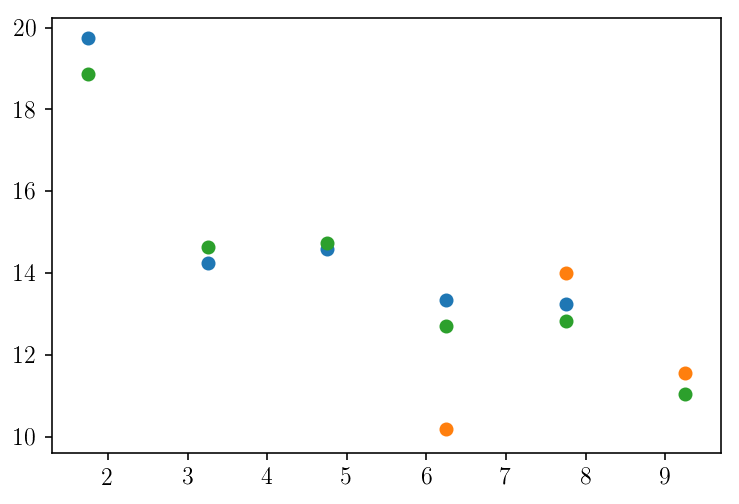

In [111]:
sigs = np.empty((len(agebins)-1,3))
err = np.empty((len(agebins)-1,3,2))
for i in range(len(agebins)-1):
    sigs[i,0] = 1/np.nanmedian(lo_samples[i,:,:,4].ravel())
    sigs[i,1] = 1/np.nanmedian(hi_samples[i,:,:,4].ravel())
    sigs[i,2] = 1/np.nanmedian(co_samples[i,:,:,4].ravel())
    err[i,0] = 1/np.nanpercentile(lo_samples[i,:,:,4].ravel(),[16,84])
    err[i,1] = 1/np.nanpercentile(hi_samples[i,:,:,4].ravel(),[16,84])
plt.scatter(agecents,sigs[:,0])
plt.scatter(agecents,sigs[:,1])
plt.scatter(agecents,sigs[:,2])


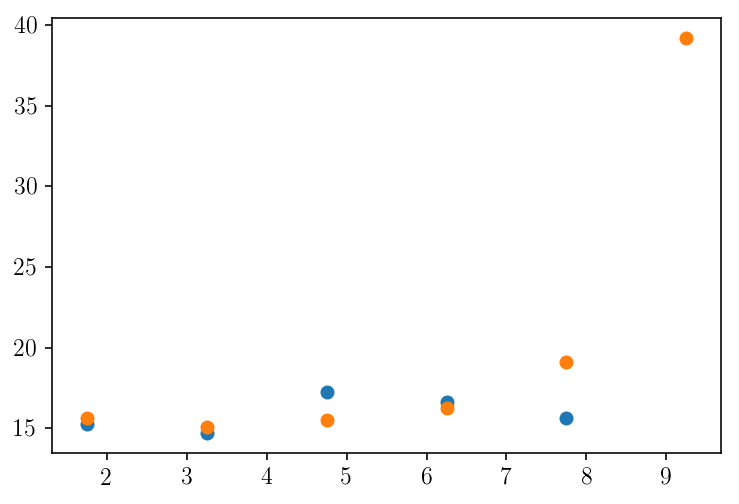

In [113]:
sigs = np.empty((len(agebins)-1,3))
err = np.empty((len(agebins)-1,3,2))
for i in range(len(agebins)-1):
    sigs[i,0] = 1/np.nanmedian(lo_samples[i,:,:,0].ravel())
    sigs[i,1] = 1/np.nanmedian(hi_samples[i,:,:,0].ravel())
    sigs[i,2] = 1/np.nanmedian(co_samples[i,:,:,0].ravel())
    err[i,0] = 1/np.nanpercentile(lo_samples[i,:,:,0].ravel(),[16,84])
    err[i,1] = 1/np.nanpercentile(hi_samples[i,:,:,0].ravel(),[16,84])
plt.scatter(agecents,sigs[:,0])
#plt.scatter(agecents,sigs[:,1])
plt.scatter(agecents,sigs[:,2])



In [117]:
np.nanpercentile(co_samples[5,:,:,0].ravel(),[16,84])

array([-0.0162401 ,  0.05743536])

In [ ]:
### norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,8,1].ravel()[mask]-lo_par[:,:,8,0].ravel()[mask], lo_par[:,:,8,2].ravel()[mask]-lo_par[:,:,8,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,8,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,8,1].ravel()[mask]-hi_par[:,:,8,0].ravel()[mask], hi_par[:,:,8,2].ravel()[mask]-hi_par[:,:,8,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,8,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\alpha_0$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
plt.ylim(-0.2,0.2)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



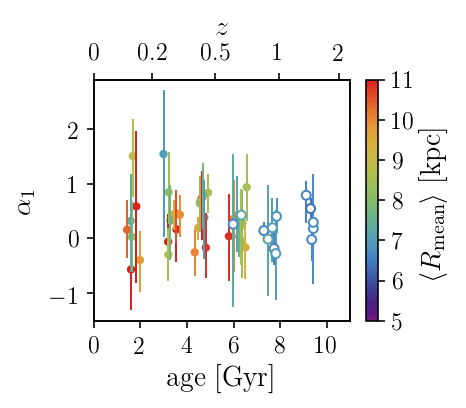

In [34]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,9,1].ravel()[mask]-lo_par[:,:,9,0].ravel()[mask], lo_par[:,:,9,2].ravel()[mask]-lo_par[:,:,9,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,9,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,9,1].ravel()[mask]-hi_par[:,:,9,0].ravel()[mask], hi_par[:,:,9,2].ravel()[mask]-hi_par[:,:,9,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,9,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\alpha_1$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



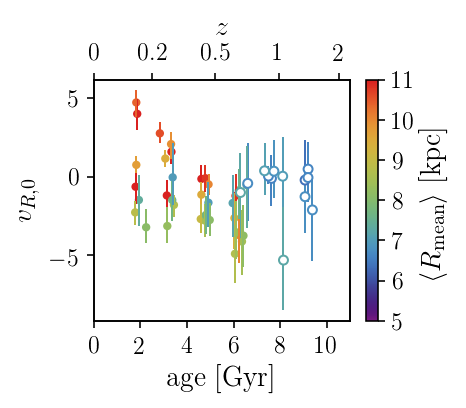

In [35]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,10,1].ravel()[mask]-lo_par[:,:,10,0].ravel()[mask], lo_par[:,:,10,2].ravel()[mask]-lo_par[:,:,10,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,10,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,10,1].ravel()[mask]-hi_par[:,:,10,0].ravel()[mask], hi_par[:,:,10,2].ravel()[mask]-hi_par[:,:,10,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,10,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$v_{R,0}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()




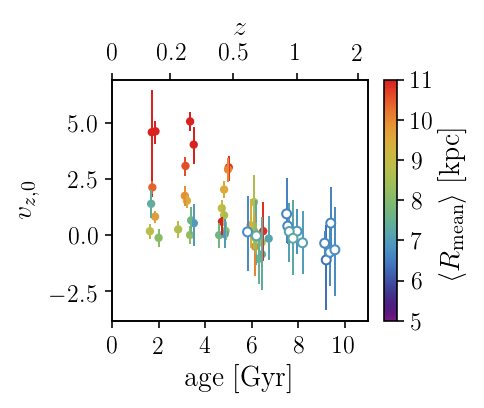

In [31]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,11,1].ravel()[mask]-lo_par[:,:,11,0].ravel()[mask], lo_par[:,:,11,2].ravel()[mask]-lo_par[:,:,11,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,11,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,11,1].ravel()[mask]-hi_par[:,:,11,0].ravel()[mask], hi_par[:,:,11,2].ravel()[mask]-hi_par[:,:,11,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,11,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$v_{z,0}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()

plt.savefig('../plots/vz0_age_Rmean.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/vz0_age_Rmean.png', format='png', dpi=400, bbox_inches='tight')





/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



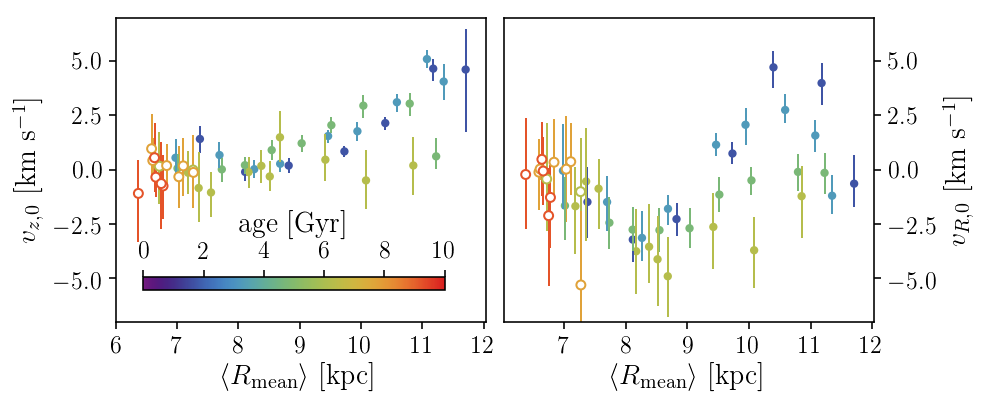

In [55]:
norm = matplotlib.colors.Normalize(
    vmin=0,
    vmax=10.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2, sharex=True)
fig.set_size_inches(1.*textwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,11,1].ravel()[mask]-lo_par[:,:,11,0].ravel()[mask], lo_par[:,:,11,2].ravel()[mask]-lo_par[:,:,11,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,11,1].ravel()[mask]
c = ax[0].scatter(lo_rmean.ravel()[mask]*8., co_val, s=10, c=s_m.to_rgba(agegrid.ravel()[mask]) )
ax[0].errorbar(lo_rmean.ravel()[mask]*8., co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(agegrid.ravel()[mask]), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,11,1].ravel()[mask]-hi_par[:,:,11,0].ravel()[mask], hi_par[:,:,11,2].ravel()[mask]-hi_par[:,:,11,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,11,1].ravel()[mask]
c = ax[0].scatter(hi_rmean.ravel()[mask]*8., co_val, s=20, edgecolor=s_m.to_rgba(agegrid.ravel()[mask]), facecolor='White', zorder=2)
ax[0].errorbar(hi_rmean.ravel()[mask]*8., co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(agegrid.ravel()[mask]), lw=1., zorder=1)
#ax[0].colorbar(s_m, label=r'$\mathrm{age\ [Gyr]}$')
ax[0].set_ylabel(r'$v_{z,0}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')

mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,10,1].ravel()[mask]-lo_par[:,:,10,0].ravel()[mask], lo_par[:,:,10,2].ravel()[mask]-lo_par[:,:,10,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,10,1].ravel()[mask]
c = ax[1].scatter(lo_rmean.ravel()[mask]*8., co_val, s=10, c=s_m.to_rgba(agegrid.ravel()[mask]) )
ax[1].errorbar(lo_rmean.ravel()[mask]*8., co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(agegrid.ravel()[mask]), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,10,1].ravel()[mask]-hi_par[:,:,10,0].ravel()[mask], hi_par[:,:,10,2].ravel()[mask]-hi_par[:,:,10,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,10,1].ravel()[mask]
c = ax[1].scatter(hi_rmean.ravel()[mask]*8., co_val, s=20, edgecolor=s_m.to_rgba(agegrid.ravel()[mask]), facecolor='White', zorder=2)
ax[1].errorbar(hi_rmean.ravel()[mask]*8., co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(agegrid.ravel()[mask]), lw=1., zorder=1)

ax[1].set_ylabel(r'$v_{R,0}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
#plt.xticks([0.,2.,4,6.,8,10.])
#plt.xlim(0.,11.)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[0].set_ylim(-7,7)
ax[1].set_ylim(-7,7)
ax[0].set_xticks([6,7,8,9,10,11,12])
cax = fig.add_axes([0.15,0.3,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\mathrm{age\ [Gyr]}$', orientation='horizontal', cax=cax)
cb.ax.xaxis.set_ticks_position('top')
cb.ax.xaxis.set_label_position('top')
fig.tight_layout()
fig.subplots_adjust(wspace=0.05)
plt.savefig('../plots/vRz0_Rmean_age.pdf', format='pdf', dpi=400, bbox_inches='tight')
plt.savefig('../plots/vRz0_Rmean_age.png', format='png', dpi=400, bbox_inches='tight')





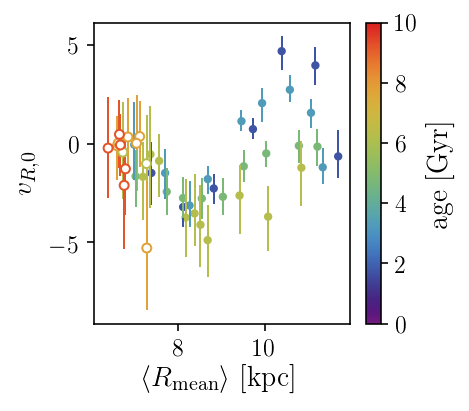

In [46]:
norm = matplotlib.colors.Normalize(
    vmin=0,
    vmax=10.)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,10,1].ravel()[mask]-lo_par[:,:,10,0].ravel()[mask], lo_par[:,:,10,2].ravel()[mask]-lo_par[:,:,10,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,10,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(lo_rmean.ravel()[mask]*8., co_val, s=10, c=s_m.to_rgba(agegrid.ravel()[mask]) )
plt.errorbar(lo_rmean.ravel()[mask]*8., co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(agegrid.ravel()[mask]), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,10,1].ravel()[mask]-hi_par[:,:,10,0].ravel()[mask], hi_par[:,:,10,2].ravel()[mask]-hi_par[:,:,10,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,10,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(hi_rmean.ravel()[mask]*8., co_val, s=20, edgecolor=s_m.to_rgba(agegrid.ravel()[mask]), facecolor='White', zorder=2)
plt.errorbar(hi_rmean.ravel()[mask]*8., co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(agegrid.ravel()[mask]), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\mathrm{age\ [Gyr]}$')
plt.ylabel(r'$v_{R,0}$')
plt.xlabel(r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
#plt.xticks([0.,2.,4,6.,8,10.])
#plt.xlim(0.,11.)
ax = plt.gca()
#twin = ax.twiny()
#twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
#twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
#labels = ['0','0.2','0.5','1', '2','20']
#twin.set_xticklabels(labels)
#twin.set_xlabel(r'$z$')
#twin.set_xlim(ax.get_xlim())
fig.tight_layout()



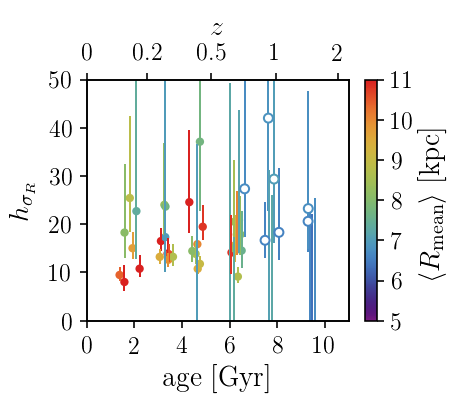

In [43]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([1/lo_par[:,:,0,1].ravel()[mask]-1/lo_par[:,:,0,0].ravel()[mask], 1/lo_par[:,:,0,2].ravel()[mask]-1/lo_par[:,:,0,1].ravel()[mask]])[0].T
co_val = 1/lo_par[:,:,0,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([1/hi_par[:,:,0,1].ravel()[mask]-1/hi_par[:,:,0,0].ravel()[mask], 1/hi_par[:,:,0,2].ravel()[mask]-1/hi_par[:,:,0,1].ravel()[mask]])[0].T
co_val = 1/hi_par[:,:,0,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$h_{\sigma_R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
plt.ylim(0.,50.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



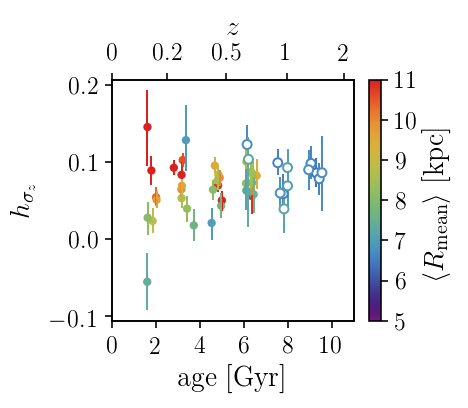

In [41]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,4,1].ravel()[mask]-lo_par[:,:,4,0].ravel()[mask], lo_par[:,:,4,2].ravel()[mask]-lo_par[:,:,4,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,4,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,4,1].ravel()[mask]-hi_par[:,:,4,0].ravel()[mask], hi_par[:,:,4,2].ravel()[mask]-hi_par[:,:,4,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,4,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$h_{\sigma_z}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()




In [78]:
def v_R0_R(v_R0, R, params=[0.]):
    a = params
    return v_R0*np.exp((R-8.)/a)

def dv_R0_R(v_R0, R, params=[0.]):
    a = params
    return v_R0/a[0]*np.exp((R-8.)/a)

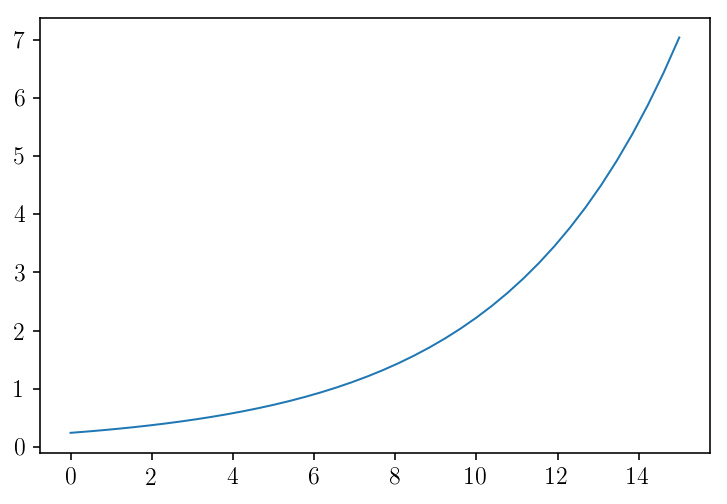

In [94]:
xs = np.linspace(0.,15.,40)
plt.plot(xs, np.sqrt(v_R0_R(1.,xs, params=[4.])**2+v_R0_R(1.,xs, params=[5.])**2))

(0, 20.0)

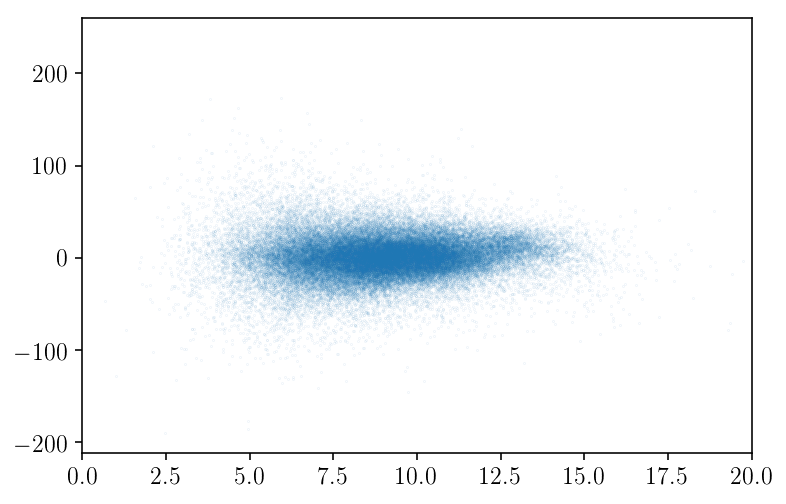

In [106]:
mask = (dat['Age'] < 4.) & (dat['FE_H'] < -0.3)
plt.scatter((rap+rperi)/2.*8., vRvTvz[:,2]*220., s=0.001)
plt.xlim(0,20.)

In [61]:
def running_median()

array([1.34114401, 1.30985314, 1.46198279, ..., 1.21763565, 1.33928038,
       1.1659007 ])

In [97]:
tana = lo_par[:,:,8,1]+lo_par[:,:,9,1]*(lo_med_z[:,:,2]/lo_rmean)

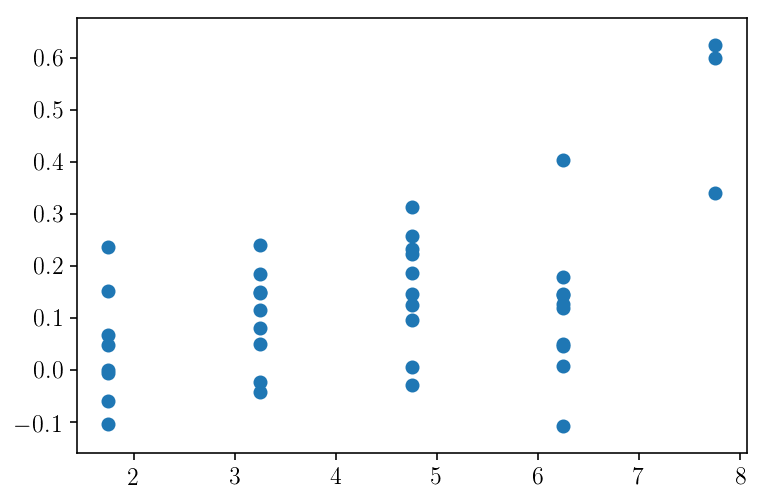

In [99]:
plt.scatter(agegrid.ravel(), np.arctan(tana.ravel()))

In [107]:
if os.path.isfile('../sav/apdr14gaiadr2_astroNN_ages_distances_ellipsoidv0_fR_monoage_samples.npy'):
    with open('../sav/apdr14gaiadr2_astroNN_ages_distances_ellipsoidv0_fR_monoage_samples.npy', 'rb') as f:
        lo_samples = np.load(f)
        hi_samples = np.load(f)
        co_samples = np.load(f)
        lo_med_z = np.load(f)
        hi_med_z = np.load(f)
        co_med_z = np.load(f)
        
agebins = np.arange(1.,14.,1.5)
fehbins = np.arange(-0.6,0.6,0.1)

lo_par = np.empty([len(agebins)-1,len(fehbins)-1,15,3])
hi_par = np.empty([len(agebins)-1,len(fehbins)-1,15,3])
co_par = np.empty([len(agebins)-1,len(fehbins)-1,15,3])
for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        lo_par[i,j] = np.nanpercentile(lo_samples[i,j], [16,50,84], axis=0).T
        hi_par[i,j] = np.nanpercentile(hi_samples[i,j], [16,50,84], axis=0).T
        co_par[i,j] = np.nanpercentile(co_samples[i,j], [16,50,84], axis=0).T
        
co_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_nbins = np.zeros([len(agebins)-1, len(fehbins)-1])
co_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_alpha = np.zeros([len(agebins)-1, len(fehbins)-1])
co_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_rmean = np.zeros([len(agebins)-1, len(fehbins)-1])
co_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
lo_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])
hi_ecc = np.zeros([len(agebins)-1, len(fehbins)-1])



for i in range(len(agebins)-1):
    for j in range(len(fehbins)-1):
        co_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_nbins[i,j] = np.sum([(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])])
        lo_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_alpha[i,j] = np.median(dat['AVG_ALPHAFE'][(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])
        co_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]/2.)
        lo_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))]/2.)
        hi_rmean[i,j] = np.nanmedian((rperi+rap)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)]/2.)
        co_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1])]/2.)
        lo_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] < define_rgbsample.alphaedge(dat['FE_H']))])
        hi_ecc[i,j] = np.nanmedian((e)[(dat['Age'] > agebins[i]) & (dat['Age'] < agebins[i+1]) & (dat['FE_H'] > fehbins[j]) & (dat['FE_H'] < fehbins[j+1]) & (dat['AVG_ALPHAFE'] > define_rgbsample.alphaedge(dat['FE_H'])+0.04)])

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/astjmack/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1019: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)



/home/astjmack/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



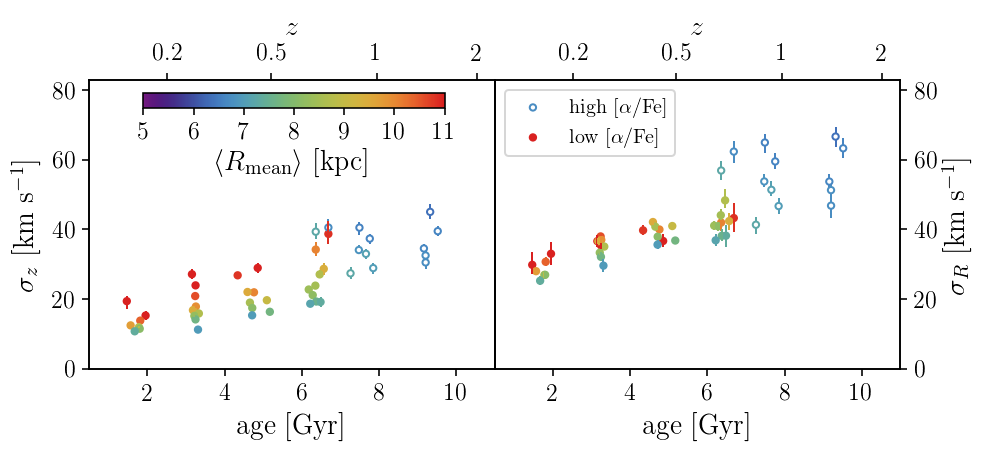

In [108]:
agegrid = (np.ones([len(agebins)-1, len(fehbins)-1]).T*((agebins[1:]+agebins[:-1])/2.)).T
fehgrid = (np.ones([len(agebins)-1, len(fehbins)-1])*((fehbins[1:]+fehbins[:-1])/2.))



jitter = np.random.randn(len(agegrid.ravel()))



norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig, ax = plt.subplots(1,2)
fig.set_size_inches(textwidth,columnwidth)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,5,1].ravel()[mask]-10**hi_par[:,:,5,0].ravel()[mask], 10**hi_par[:,:,5,2].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**hi_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1.,zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,5,1].ravel()[mask]-10**lo_par[:,:,5,0].ravel()[mask], 10**lo_par[:,:,5,2].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
x = agegrid.ravel()[mask]+0.2*jitter[mask]
y = 10**lo_par[:,:,5,1].ravel()[mask]
c = ax[0].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
ax[0].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)



ax[0].set_ylabel(r'$\sigma_{z}\ \mathrm{[km\ s^{-1}]}$')
ax[0].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,1].ravel()[mask]-10**hi_par[:,:,1,0].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**hi_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.) , facecolor='White', zorder=2, label=r'$\mathrm{high\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)

mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,1].ravel()[mask]-10**lo_par[:,:,1,0].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
y = 10**lo_par[:,:,1,1].ravel()[mask]
x = agegrid.ravel()[mask]+0.2*jitter[mask]
c = ax[1].scatter(x, y, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) , label=r'$\mathrm{low\ [\alpha/Fe]}$')
ax[1].errorbar(x, y, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

ax[1].legend(frameon=True)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position('right')

ax[1].set_ylabel(r'$\sigma_{R}\ \mathrm{[km\ s^{-1}]}$')
ax[1].set_xlabel(r'$\mathrm{age\ [Gyr]}$')
fig.tight_layout()
fig.subplots_adjust(wspace=0.)
cax = fig.add_axes([0.15,0.75,0.3,0.03])
cb = plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$', cax=cax, orientation='horizontal')
#cb.ax.xaxis.set_ticks_position('top')
#cb.ax.xaxis.set_label_position('top')
ax[0].set_ylim(0,83)
ax[1].set_ylim(0,83)
ax[0].set_xlim(0.5,11)
ax[1].set_xlim(0.5,11)


ax[0].set_xticks([2,4,6,8,10])
ax[1].set_xticks([2,4,6,8,10])


twin = ax[0].twiny()
twin.set_xlim(ax[0].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.])))
labels = ['0','0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[0].get_xlim())


twin = ax[1].twiny()
twin.set_xlim(ax[1].get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.2,0.5,1.,2.])))
labels = ['0.2','0.5','1','2']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax[1].get_xlim())

fig.tight_layout()
fig.subplots_adjust(wspace=0.)



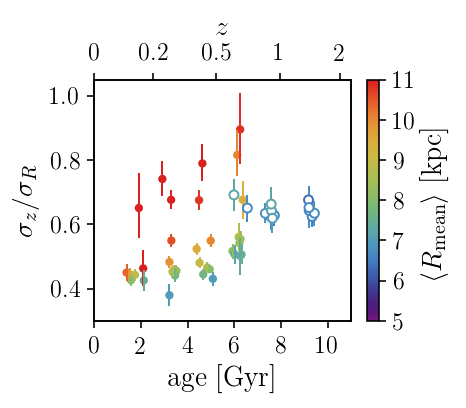

In [109]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([10**lo_par[:,:,1,0].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask], 10**lo_par[:,:,1,2].ravel()[mask]-10**lo_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask], 10**lo_par[:,:,5,0].ravel()[mask]-10**lo_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**lo_par[:,:,5,1].ravel()[mask]/10**lo_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**lo_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**lo_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([10**hi_par[:,:,1,0].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask], 10**hi_par[:,:,1,2].ravel()[mask]-10**hi_par[:,:,1,1].ravel()[mask]])[0].T
yerr_1 = np.dstack([10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask], 10**hi_par[:,:,5,0].ravel()[mask]-10**hi_par[:,:,5,1].ravel()[mask]])[0].T
co_val = 10**hi_par[:,:,5,1].ravel()[mask]/10**hi_par[:,:,1,1].ravel()[mask]
hi_yerr = co_val*np.sqrt((yerr/10**hi_par[:,:,1,1].ravel()[mask])**2+(yerr_1/10**hi_par[:,:,5,1].ravel()[mask])**2)
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=hi_yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.ylim(0.3,1.05)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\sigma_{z}/\sigma_{R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()




In [110]:
import corner

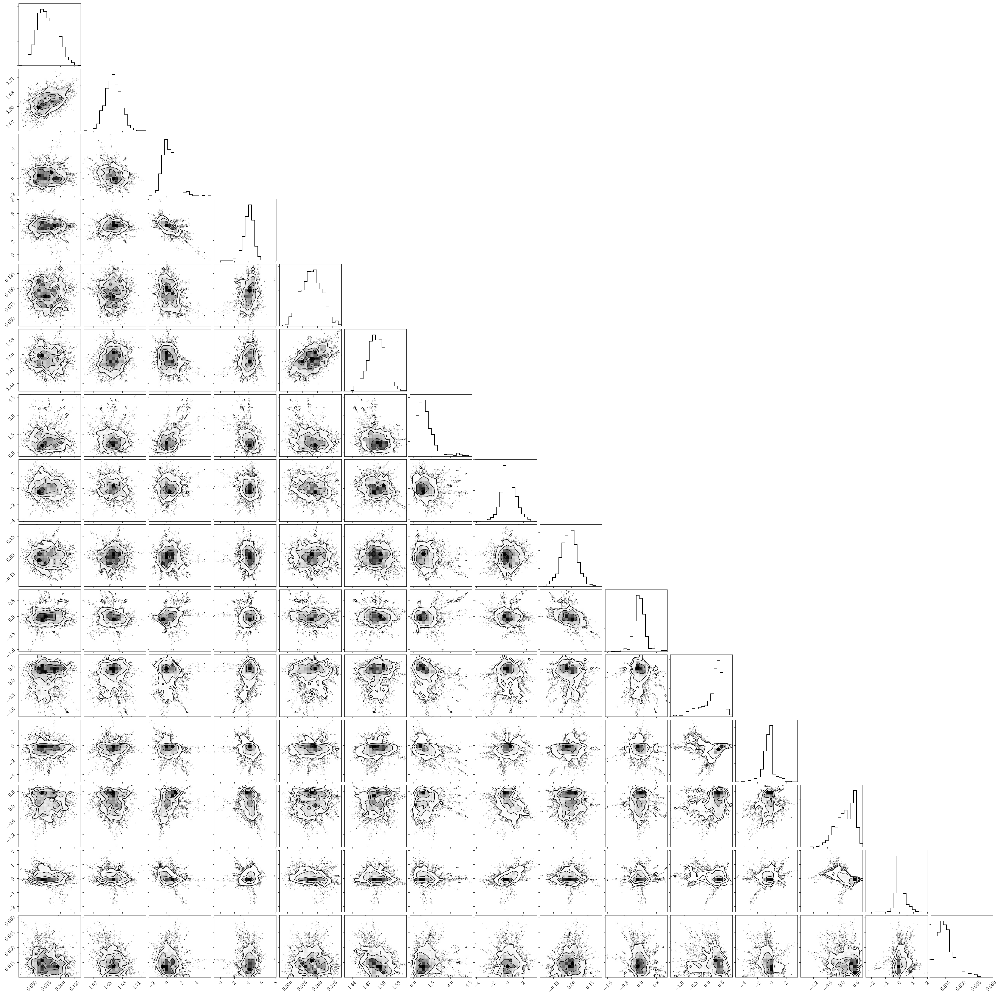

In [111]:
fig = corner.corner(co_samples[3,3])

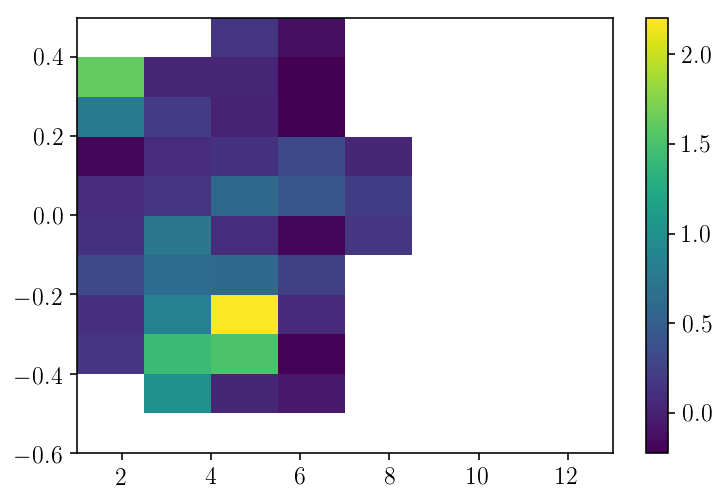

In [114]:
plt.imshow(np.rot90(lo_par[:,:,13,1]), extent=[agebins[0], agebins[-1], fehbins[0], fehbins[-1]], aspect='auto')
plt.colorbar()

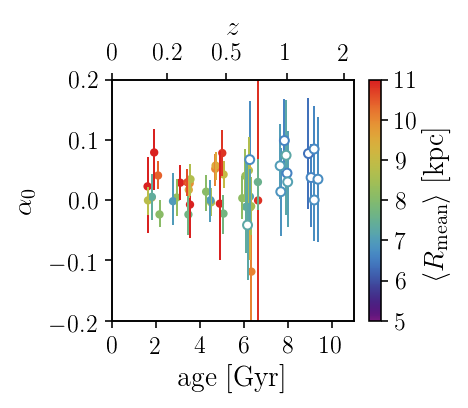

In [115]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,8,1].ravel()[mask]-lo_par[:,:,8,0].ravel()[mask], lo_par[:,:,8,2].ravel()[mask]-lo_par[:,:,8,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,8,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,8,1].ravel()[mask]-hi_par[:,:,8,0].ravel()[mask], hi_par[:,:,8,2].ravel()[mask]-hi_par[:,:,8,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,8,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\alpha_0$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
plt.ylim(-0.2,0.2)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



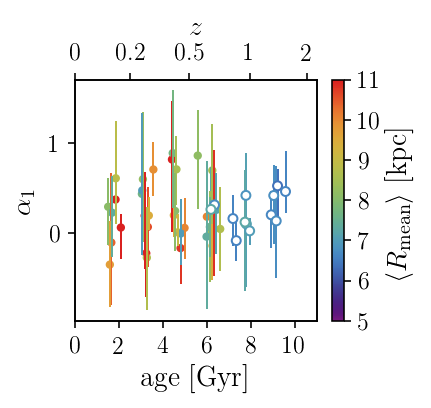

In [116]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,9,1].ravel()[mask]-lo_par[:,:,9,0].ravel()[mask], lo_par[:,:,9,2].ravel()[mask]-lo_par[:,:,9,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,9,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,9,1].ravel()[mask]-hi_par[:,:,9,0].ravel()[mask], hi_par[:,:,9,2].ravel()[mask]-hi_par[:,:,9,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,9,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$\alpha_1$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



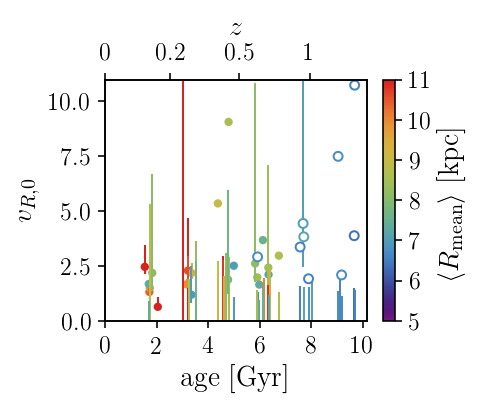

In [168]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
i = 10
fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([1/lo_par[:,:,i,1].ravel()[mask]-1/lo_par[:,:,i,0].ravel()[mask], 1/lo_par[:,:,i,2].ravel()[mask]-1/lo_par[:,:,i,1].ravel()[mask]])[0].T
co_val = 1/lo_par[:,:,i,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([1/hi_par[:,:,i,1].ravel()[mask]-1/hi_par[:,:,i,0].ravel()[mask], 1/hi_par[:,:,i,2].ravel()[mask]-1/hi_par[:,:,i,1].ravel()[mask]])[0].T
co_val = 1/hi_par[:,:,i,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$v_{R,0}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.ylim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()




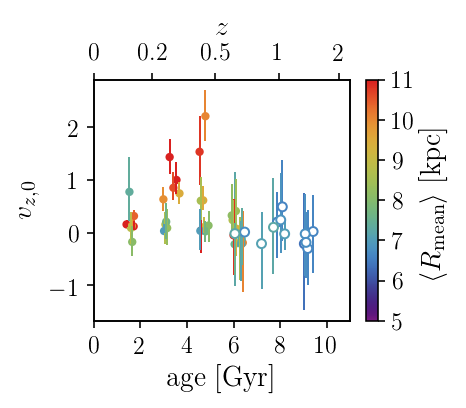

In [119]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 
i = 13
fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,i,1].ravel()[mask]-lo_par[:,:,i,0].ravel()[mask], lo_par[:,:,i,2].ravel()[mask]-lo_par[:,:,i,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,i,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,i,1].ravel()[mask]-hi_par[:,:,i,0].ravel()[mask], hi_par[:,:,i,2].ravel()[mask]-hi_par[:,:,i,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,i,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$v_{z,0}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()







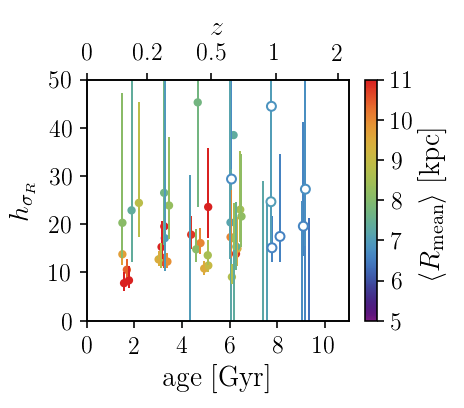

In [120]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([1/lo_par[:,:,0,1].ravel()[mask]-1/lo_par[:,:,0,0].ravel()[mask], 1/lo_par[:,:,0,2].ravel()[mask]-1/lo_par[:,:,0,1].ravel()[mask]])[0].T
co_val = 1/lo_par[:,:,0,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([1/hi_par[:,:,0,1].ravel()[mask]-1/hi_par[:,:,0,0].ravel()[mask], 1/hi_par[:,:,0,2].ravel()[mask]-1/hi_par[:,:,0,1].ravel()[mask]])[0].T
co_val = 1/hi_par[:,:,0,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$h_{\sigma_R}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
plt.ylim(0.,50.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()



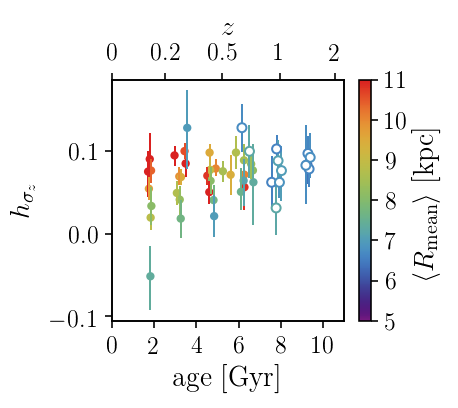

In [121]:
norm = matplotlib.colors.Normalize(
    vmin=5,
    vmax=11)

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

fig = plt.figure()
fig.set_size_inches(1.*columnwidth,0.9*columnwidth)
mask = lo_nbins.ravel() > 200
yerr = np.dstack([lo_par[:,:,4,1].ravel()[mask]-lo_par[:,:,4,0].ravel()[mask], lo_par[:,:,4,2].ravel()[mask]-lo_par[:,:,4,1].ravel()[mask]])[0].T
co_val = lo_par[:,:,4,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=10, c=s_m.to_rgba(lo_rmean.ravel()[mask]*8.) )
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(lo_rmean.ravel()[mask]*8.), lw=1.)

mask = hi_nbins.ravel() > 200
yerr = np.dstack([hi_par[:,:,4,1].ravel()[mask]-hi_par[:,:,4,0].ravel()[mask], hi_par[:,:,4,2].ravel()[mask]-hi_par[:,:,4,1].ravel()[mask]])[0].T
co_val = hi_par[:,:,4,1].ravel()[mask]
jitter = np.random.randn(len(agegrid.ravel()[mask]))
c = plt.scatter(agegrid.ravel()[mask]+0.2*jitter, co_val, s=20, edgecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), facecolor='White', zorder=2)
plt.errorbar(agegrid.ravel()[mask]+0.2*jitter, co_val, yerr=yerr, fmt='None', ecolor=s_m.to_rgba(hi_rmean.ravel()[mask]*8.), lw=1., zorder=1)
plt.colorbar(s_m, label=r'$\langle R_{\mathrm{mean}}\rangle\ \mathrm{[kpc]}$')
plt.ylabel(r'$h_{\sigma_z}$')
plt.xlabel(r'$\mathrm{age\ [Gyr]}$')
plt.xticks([0.,2.,4,6.,8,10.])
plt.xlim(0.,11.)
ax = plt.gca()
twin = ax.twiny()
twin.set_xlim(ax.get_xlim())
a_s = 1/(1+np.array([0.,2.,4.]))
twin.set_xticks(z2age(np.array([0.,0.2,0.5,1.,2.,20.])))
labels = ['0','0.2','0.5','1', '2','20']
twin.set_xticklabels(labels)
twin.set_xlabel(r'$z$')
twin.set_xlim(ax.get_xlim())
fig.tight_layout()




In [132]:
def v0_profile(R,v0,h):
    return v0*np.array([np.exp((R-8.)*hsamples[i]) for i in range(len(hsamples))]).T

In [148]:
hsamples = lo_samples[0,3,:,10]
v0samples = lo_samples[0,3,:,11]
Rs = np.linspace(3.,15.,100)
profiles = v0_profile(Rs,hsamples,v0samples)

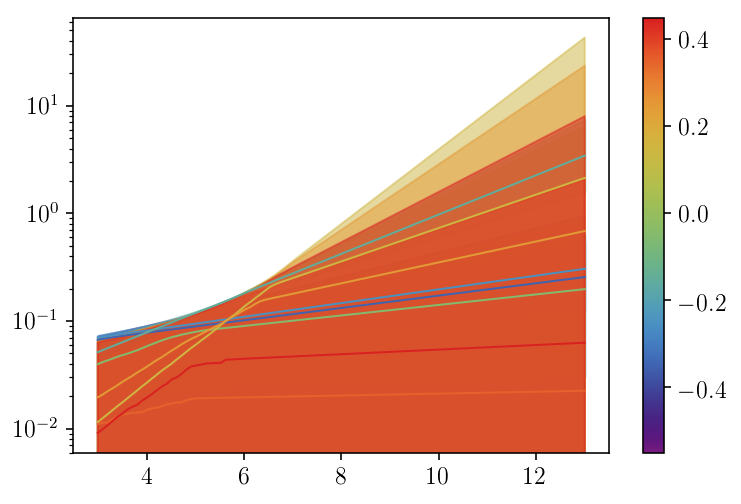

In [165]:
norm = matplotlib.colors.Normalize(
    vmin=np.min(fehgrid),
    vmax=np.max(fehgrid))

# choose a colormap
c_m = matplotlib.cm.viridis

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap=cm_rainbow, norm=norm)
s_m.set_array([]) 

for i in range(len(fehgrid[2,:])):
    hsamples = lo_samples[2,i,:,12]
    v0samples = lo_samples[2,i,:,13]
    Rs = np.linspace(3.,13.,100)
    profiles = v0_profile(Rs,hsamples,v0samples)
    plt.plot(Rs, np.median(profiles, axis=1),color=s_m.to_rgba(fehgrid[2,i]))
    plt.fill_between(Rs, np.percentile(profiles, 16,axis=1),np.percentile(profiles, 84,axis=1), color=s_m.to_rgba(fehgrid[2,i]), alpha=0.5)

plt.yscale('log')
plt.colorbar(s_m)

NameError: name 'Rpz' is not defined